### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:Blue; font-size:150%; text-align:center; border-radius:10px 10px;">**_Import Libraries_**</p>

In [1]:
# libraries for EDA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import cufflinks as cf

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
pd.set_option('display.max_rows', 1000)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', 100)

#Enabling the offline mode for interactive plotting locally
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()
import plotly.io as pio
pio.renderers.default = "colab"
#To display the plots
%matplotlib inline
from ipywidgets import interact

<a style="color:Blue" >**Reading data into the program**</a>

In [2]:
df0 = pd.read_csv("EXIST_2018.csv")
df0

,Date,Hour,HOLY,MCP,MCP_24,MCP_168,MCP_672,PISO,PIBO,SSOV,SBOV,MO,MB,TV,DER,TG,NG,HYD,LIG,RYHD,ICOAL,WIND,SOL,FUEL,GEO,ASPH,BCOAL,BIO,IMEX,WAS,GASP,ANK,IST
0,2018-01-01,00:00:00,0,55.040,47.440,38.250,27.810,8197.900,10649.500,29100.300,15069.800,12011.600,12011.700,544371.189,3.777,30379.530,7955.330,5748.650,5166.650,1898.920,6356.820,1482.380,0.000,179.200,781.240,280.410,198.500,246.280,0.000,85.150,186.435,1.800,7.800
1,2018-01-01,01:00:00,0,54.440,41.560,38.250,36.590,9161.100,6188.700,31475.500,15687.000,12662.200,12662.200,515520.340,3.777,28280.820,7465.350,4512.220,5159.900,1845.040,6077.710,1438.050,0.000,183.100,785.670,282.620,198.500,244.890,0.000,87.770,186.435,1.500,8.100
2,2018-01-01,02:00:00,0,43.730,26.180,27.810,36.590,9592.400,6017.900,32891.800,15444.200,12693.800,12693.900,360364.316,3.777,26811.790,6907.140,3909.250,5173.990,1886.980,5701.790,1464.770,0.000,179.400,791.230,273.780,194.500,247.690,0.000,81.270,186.435,1.100,7.600
3,2018-01-01,03:00:00,0,40.970,25.130,35.520,26.710,9375.700,5831.100,33120.300,15043.500,12297.700,12297.800,335572.221,3.777,25900.830,6836.270,3496.040,5222.010,1783.040,5216.620,1575.780,0.000,176.700,791.420,273.780,196.500,248.080,0.000,84.590,186.435,0.500,7.400
4,2018-01-01,04:00:00,0,29.860,25.130,38.250,36.390,9234.300,5693.800,33213.900,14953.700,12208.200,12208.300,333326.464,3.777,25454.700,6728.720,3231.800,5183.250,1724.650,5110.530,1711.830,0.000,182.900,783.440,273.780,193.500,245.110,0.000,85.190,186.435,0.000,7.200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43674,2023-01-01,19:00:00,0,224.620,236.140,257.250,257.920,9750.400,19752.600,25083.100,25596.200,21304.800,21304.800,4845274.365,18.703,34711.430,9254.910,5524.660,5446.660,978.900,9269.390,687.700,0.000,65.000,1261.830,75.070,419.280,964.680,688.160,75.190,1032.200,0.000,11.900
43675,2023-01-01,20:00:00,0,224.620,205.870,202.210,241.800,9483.400,19108.900,24367.500,24884.300,20850.000,20849.600,4371176.106,18.703,33235.310,8855.380,4281.830,5379.670,1063.010,9292.520,789.030,0.000,65.300,1268.060,72.860,401.920,981.630,704.390,79.710,1032.200,0.000,12.000
43676,2023-01-01,21:00:00,0,224.620,216.080,241.170,161.200,9577.500,18428.100,24863.600,24161.900,19928.800,19928.800,4249568.776,18.703,31937.540,7538.880,4016.780,5536.550,1038.450,9270.580,908.460,0.000,66.100,1277.350,75.070,382.890,975.860,769.550,81.020,1032.200,-0.300,12.200
43677,2023-01-01,22:00:00,0,184.050,190.970,203.600,204.130,9633.400,16617.700,24073.200,22520.400,18569.400,18569.400,3665598.832,18.703,31004.800,5918.090,4743.610,5408.150,999.920,9272.480,1025.830,0.000,64.400,1286.910,75.070,397.090,973.410,768.780,71.060,1032.200,-1.100,12.100


In [3]:
df = df0.copy()

## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:Blue; font-size:150%; text-align:center; border-radius:10px 10px;">**_DATA Preprocessing_**</p>

- In this step we divide our data to X(Features) and y(Target) then ,
- To train and evaluation purposes we create train and test sets,
- Lastly, scale our data if features not in same scale.

In [4]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split

import scipy.stats as stats
from scipy.stats import skew

import warnings
warnings.filterwarnings('ignore')
plt.rcParams["figure.figsize"] = (7,4)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 1000)
pd.options.display.float_format = '{:.3f}'.format

from sklearn.model_selection import KFold, cross_val_predict, train_test_split,GridSearchCV,cross_val_score, cross_validate, RandomizedSearchCV
from sklearn.linear_model import LinearRegression, Lasso, Ridge,ElasticNet

from sklearn.pipeline import Pipeline

import shap

from sklearn.svm import SVR
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.linear_model import LogisticRegression
from xgboost import XGBRegressor, plot_importance
from catboost import CatBoostRegressor, cv, Pool
import lightgbm as lgb
from sklearn.impute import SimpleImputer

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input,Dense,Activation,Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from keras.models import load_model
from tensorflow.keras.models import load_model


In [5]:
drop_list = ["Date","Hour"]
df.drop(columns = drop_list, inplace=True)

### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_Train / Test and Split_**</p>

In [6]:
X = df.drop('MCP',axis=1)
y = df['MCP']

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=35)

### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_Scaling_**</p>

In [8]:
scaler = MinMaxScaler().set_output(transform="pandas")
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [10]:
print("df boyutu:", df.shape)

print("X_train'in boyutu:", X_train.shape)
print("y_train'in boyutu:", y_train.shape)

print("X_test'in boyutu:", X_test.shape)
print("y_test'in boyutu:", y_test.shape)

df boyutu: (43679, 31)
X_train'in boyutu: (34943, 30)
y_train'in boyutu: (34943,)
X_test'in boyutu: (8736, 30)
y_test'in boyutu: (8736,)


## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:red; font-size:150%; text-align:center; border-radius:10px 10px;">**_TUNED Modelling_**</p>

In [9]:
def mape(y_true, y_pred):
    absolute_percentage_error = np.abs((y_true - y_pred) / y_true)
    absolute_percentage_error[~np.isfinite(absolute_percentage_error)] = 0  # "inf" değerlerini 0'a dönüştür
    return np.mean(absolute_percentage_error) * 100

def eval_metric(model, X_train, y_train, X_test, y_test):
    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)

    scores = {"train": {"R2": r2_score(y_train, y_train_pred),
                        "mae": mean_absolute_error(y_train, y_train_pred),
                        "mse": mean_squared_error(y_train, y_train_pred),
                        "rmse": mean_squared_error(y_train, y_train_pred, squared=False),
                        "mape": mape(y_train, y_train_pred)},
              "test": {"R2": r2_score(y_test, y_pred),
                       "mae": mean_absolute_error(y_test, y_pred),
                       "mse": mean_squared_error(y_test, y_pred),
                       "rmse": mean_squared_error(y_test, y_pred, squared=False),
                       "mape": mape(y_test, y_pred)}}

    return pd.DataFrame(scores)

## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:red; font-size:150%; text-align:center; border-radius:10px 10px;">**_1.XGBoost Regression_**</p>

### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_Tuned model_**</p>

In [12]:
tuned_xgb= XGBRegressor(objective ='reg:squarederror',learning_rate= 0.05, max_depth= 11, n_estimators= 150,colsample_bytree=0.5,alpha=10,random_state=35).fit(X_train, y_train)

In [13]:
eval_metric(tuned_xgb, X_train, y_train, X_test, y_test)

,train,test
R2,0.996,0.946
mae,2.238,6.113
mse,10.744,134.433
rmse,3.278,11.595
mape,13.827,52.852


### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_Error Metrics_**</p>

In [14]:
y_pred_xgb = tuned_xgb.predict(X_test)

<a style="color:Blue" >**R2**</a>

In [15]:
xgb_R2 = round(r2_score(y_test, y_pred_xgb),3)
xgb_R2

0.946

<a style="color:Blue" >**MAE**</a>

In [16]:
xgb_mae = round(mean_absolute_error(y_test, y_pred_xgb),2)
xgb_mae

6.11

<a style="color:Blue" >**MSE**</a>

In [18]:
xgb_mse = round(mean_squared_error(y_test, y_pred_xgb),2)
xgb_mse

134.43

<a style="color:Blue" >**RMSE**</a>

In [17]:
xgb_rmse = round(mean_squared_error(y_test, y_pred_xgb, squared=False),2)
xgb_rmse

11.59

<a style="color:Blue" >**MAPE**</a>

In [19]:
xgb_mape = round(mape(y_test, y_pred_xgb),2)
xgb_mape

52.85

---
---

In [20]:
mcp_mean = df["MCP"].mean()
mcp_mean

# metricleri yorumlamak için önce targetin ortalamasını alıyoruz.

67.44918862611324

In [57]:
xgb_mae / mcp_mean

0.09058670866849372

In [58]:
xgb_rmse / mcp_mean

0.17183305294072704

---
---

<a style="color:Blue" >**_Plotting residuals_**</a>

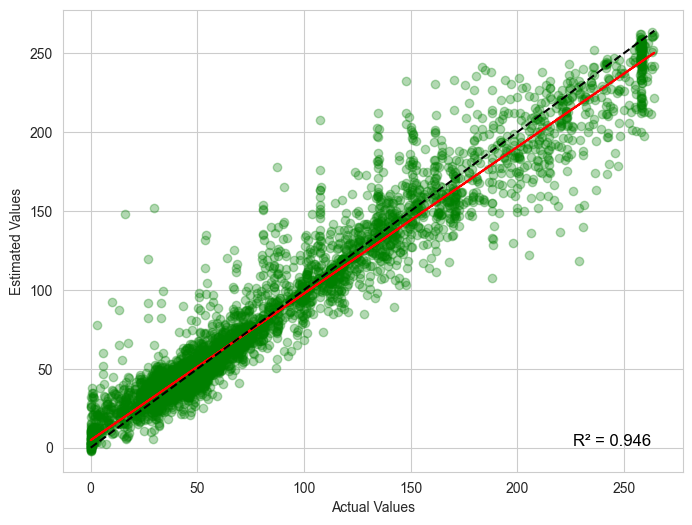

In [71]:
# Modelinizin test verisi üzerindeki tahminlerini alın
y_pred_xgb = tuned_xgb.predict(X_test)

plt.figure(figsize=(8, 6))

# Gerçek ve tahmin edilen değerler arasındaki scatter plot
plt.scatter(y_test, y_pred_xgb, alpha=0.3, color='green')

# Best fit line (en iyi uyum çizgisi) için
m, b = np.polyfit(y_test, y_pred_xgb, 1)  # 1 dereceli polinom ile uyum sağla

# En iyi uyum çizgisini çiz
plt.plot(y_test, m*y_test + b, color='red')

# Kimlik çizgisi (identity line) yerine, eksenleri eşitleyerek 45 derecelik bir çizgi çiz
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='--')

# R^2 değerini hesapla ve sağ alt köşeye yaz
r2 = r2_score(y_test, y_pred_xgb)
plt.text(0.95, 0.05, f'R² = {r2:.3f}', verticalalignment='bottom', horizontalalignment='right', 
         transform=plt.gca().transAxes, color='black', fontsize=12)


# Eksen etiketlerini ve başlığı ayarlayın
plt.xlabel('Actual Values')
plt.ylabel('Estimated Values')
#plt.title('Prediction Error')

# Grafikleri göster
plt.show()


### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_SHAP XGboost Model_**</p>

SHAP Değerleri Grafikleri Tahmin Değişkeniyle Özellikler Arasında Pozitif ve Negatif İlişkileri Gösteriyor

SHAP değerleri grafikleri, tahmin edilen değişkenle özelliklerin arasındaki pozitif ve negatif ilişkileri görselleştirmede faydalıdır. Bu grafikler sayesinde:

Hangi özelliklerin tahminlerde en önemli rol oynadığını anlayabiliriz.

Bir özelliğin değerinin değişmesiyle tahminin nasıl etkilendiğini görebiliriz.

Modelin karar verme sürecinde hangi faktörleri önceliklendirdiğini daha iyi anlayabiliriz.

Örneğin, SHAP değeri pozitifse, bu özellik modelin tahminini yukarı yönlü etkilediği anlamına gelir. Tersine, negatif bir SHAP değeri, özelliğin tahmini aşağı yönlü etkilediğini gösterir.

Bu grafikler, özellikle karmaşık modelleri anlamak ve yorumlamak için oldukça yararlı araçlar olarak kabul edilir.

In [94]:
# SHAP değerlerini hesapla
explainer_xgb = shap.Explainer(tuned_xgb)
shap_values_xgb = explainer_xgb(X_train)

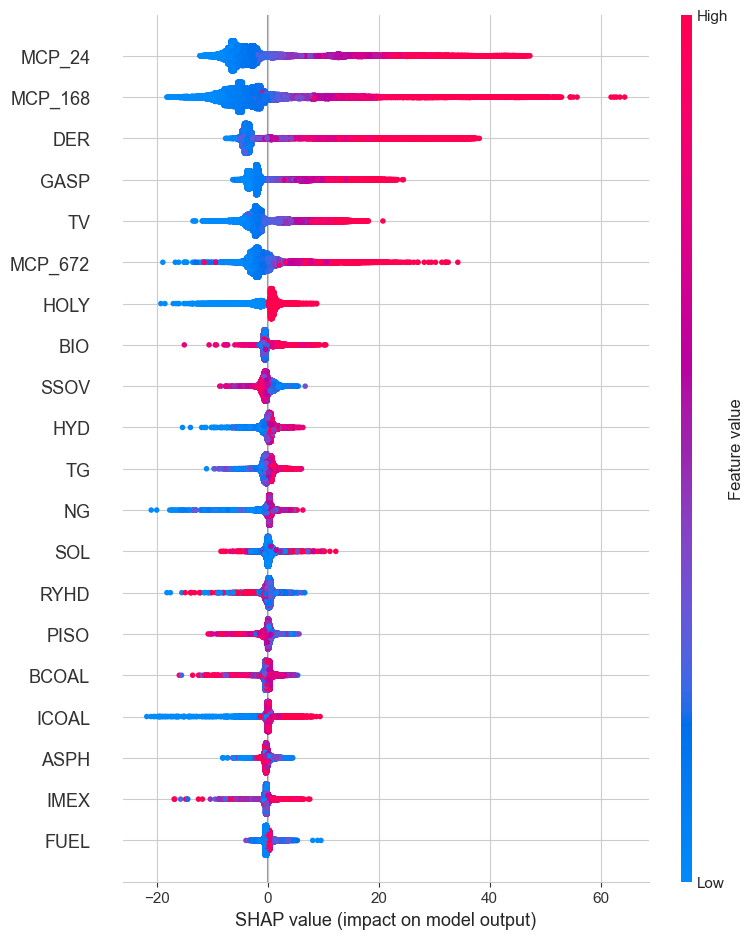

In [95]:
# SHAP özet grafiğini çiz
plt.figure(figsize=(4, 6))
shap.summary_plot(shap_values_xgb, X_train)

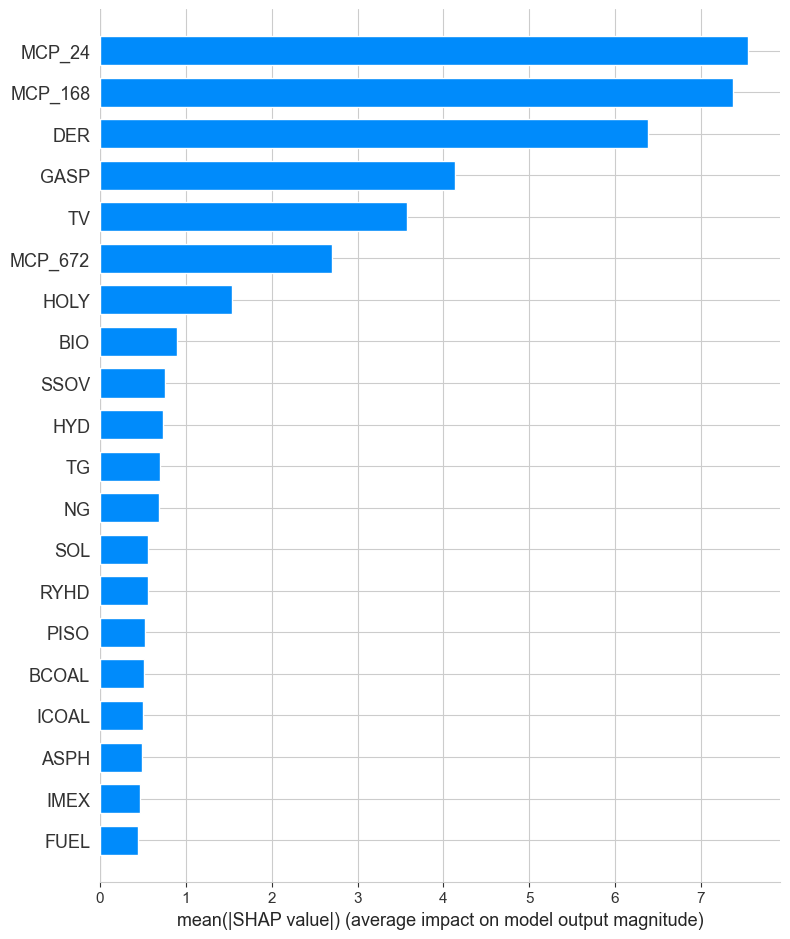

In [96]:
plt.figure(figsize=(4, 6))
shap.summary_plot(shap_values_xgb, X_train, plot_type="bar")

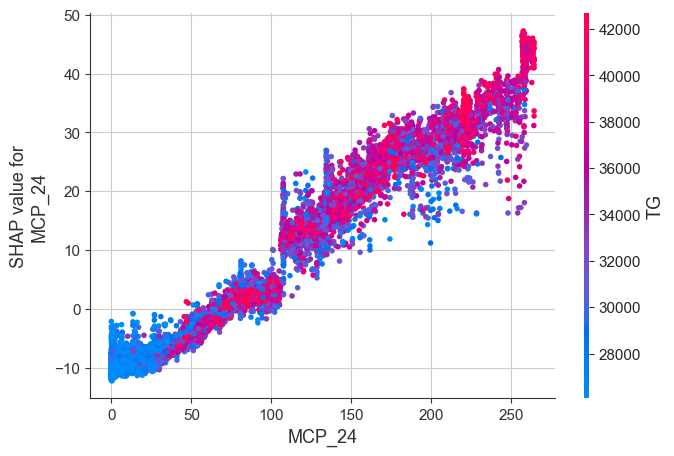

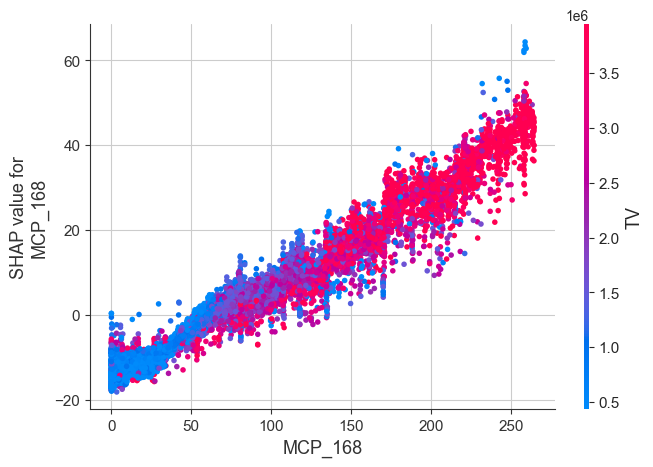

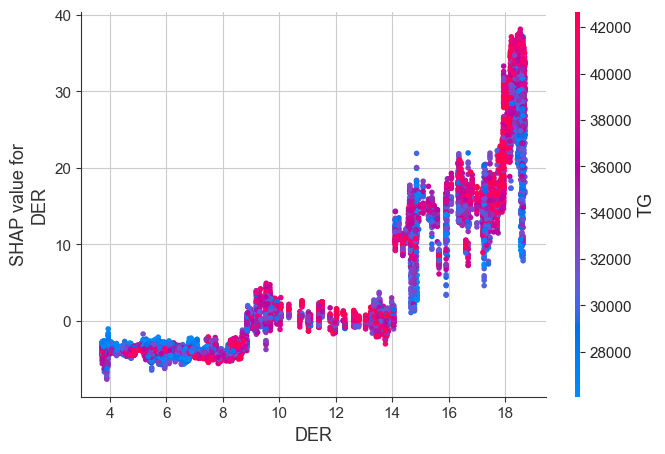

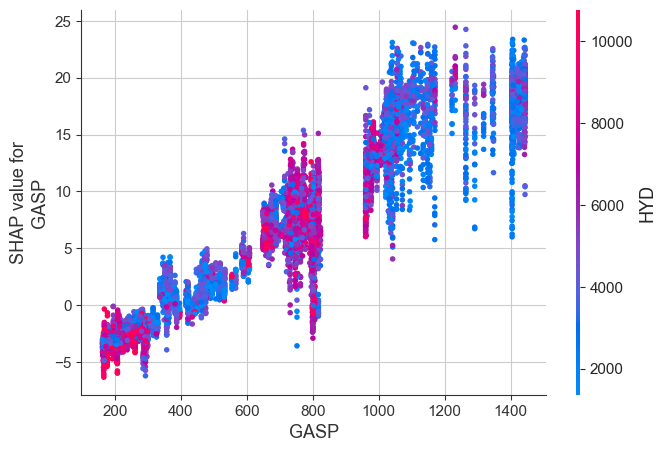

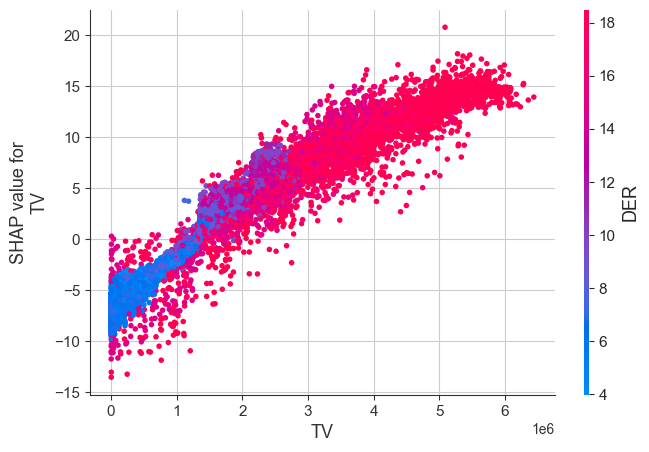

...

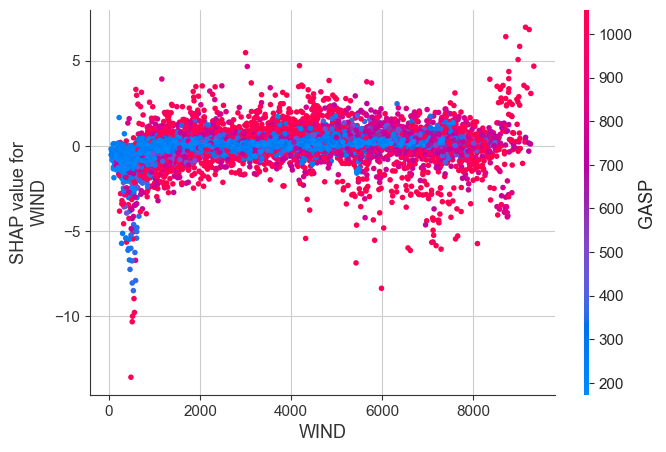

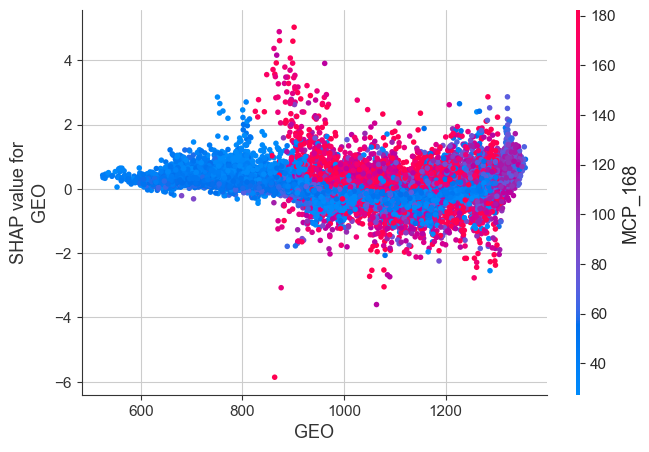

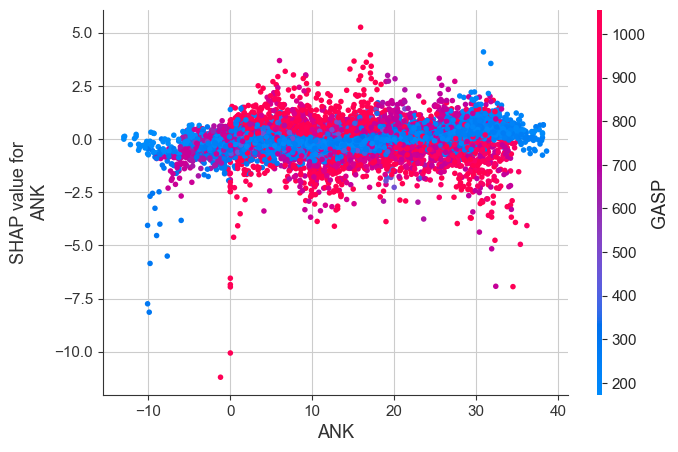

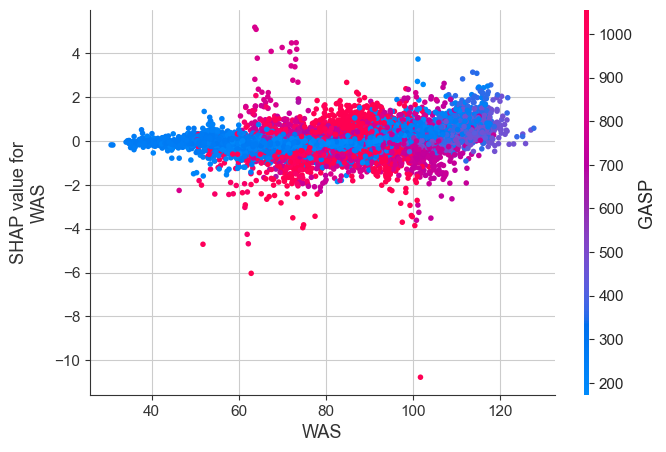

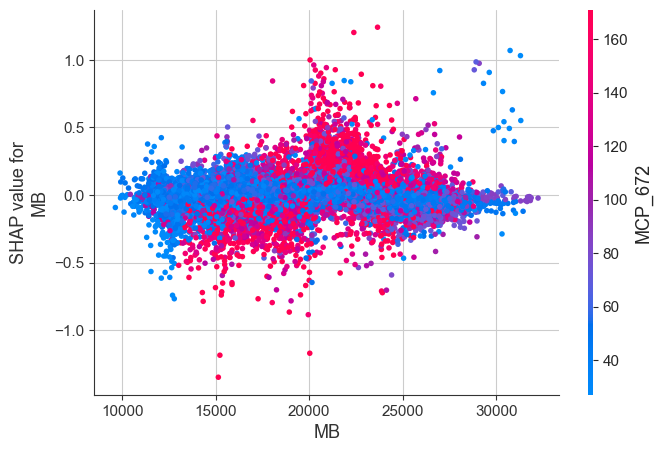

In [92]:
shap_values_array_xgb = shap_values_xgb.values  # Extract the SHAP values as a NumPy array

# Now you can use NumPy operations on shap_values_array_xgb
top_inds_xgb = np.argsort(-np.sum(np.abs(shap_values_array_xgb), 0))

# Assuming X_train is your features DataFrame or NumPy array
for i in range(len(top_inds_xgb)):
    shap.dependence_plot(top_inds_xgb[i], shap_values_array_xgb, X_train)

## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:red; font-size:150%; text-align:center; border-radius:10px 10px;">**_2.Random Forest Regression_**</p>

### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_RF Tuned_**</p>  

In [21]:
rf_tuned = RandomForestRegressor(n_estimators=300, max_depth=20, max_features= 20, random_state=35).fit(X_train, y_train) # R^2 = 0.934 

In [22]:
eval_metric(rf_tuned, X_train, y_train, X_test, y_test)

,train,test
R2,0.990,0.934
mae,2.889,6.612
mse,24.953,166.431
rmse,4.995,12.901
mape,20.654,64.849


### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_Error Metrics_**</p>

In [23]:
y_pred_rf = rf_tuned.predict(X_test)

<a style="color:Blue" >**R2**</a>

In [24]:
rf_R2 = round(r2_score(y_test, y_pred_rf),3)
rf_R2

0.934

<a style="color:Blue" >**MAE**</a>

In [25]:
rf_mae = round(mean_absolute_error(y_test, y_pred_rf),2)
rf_mae

6.61

<a style="color:Blue" >**MSE**</a>

In [26]:
rf_mse = round(mean_squared_error(y_test, y_pred_rf),2)
rf_mse

166.43

<a style="color:Blue" >**RMSE**</a>

In [27]:
rf_rmse = round(mean_squared_error(y_test, y_pred_rf, squared=False),2)
rf_rmse

12.9

<a style="color:Blue" >**MAPE**</a>

In [28]:
rf_mape = round(mape(y_test, y_pred_rf),2)
rf_mape

64.85

---
---

In [59]:
rf_mae / mcp_mean

0.0979996962845734

In [60]:
rf_rmse / mcp_mean

0.19125508049485582

---
---

<a style="color:Blue" >**_Plotting residuals_**</a>

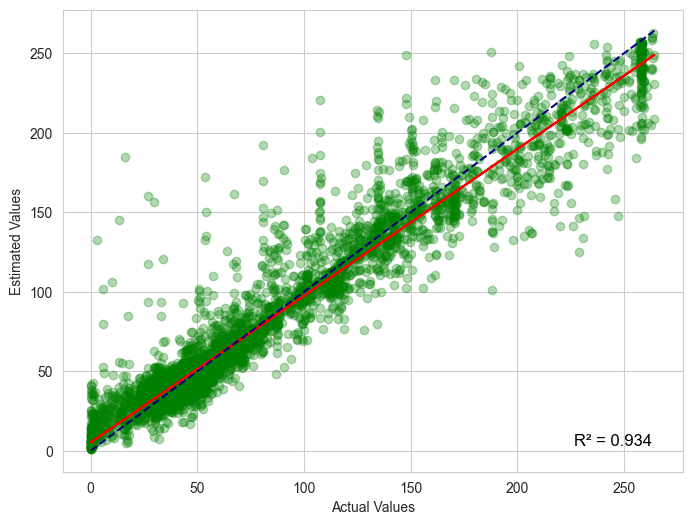

In [72]:
# Modelinizin test verisi üzerindeki tahminlerini alın
y_pred_rf = rf_tuned.predict(X_test)

plt.figure(figsize=(8, 6))

# Gerçek ve tahmin edilen değerler arasındaki scatter plot
plt.scatter(y_test, y_pred_rf, alpha=0.3, color='green')

# Best fit line (en iyi uyum çizgisi) için
m, b = np.polyfit(y_test, y_pred_rf, 1)  # 1 dereceli polinom ile uyum sağla

# En iyi uyum çizgisini çiz
plt.plot(y_test, m*y_test + b, color='red')

# Kimlik çizgisi yerine, eksenleri eşitleyerek 45 derecelik bir çizgi çiz
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='Navy', linestyle='--')

# R^2 değerini hesapla ve sağ alt köşeye yaz
r2 = r2_score(y_test, y_pred_rf)
plt.text(0.95, 0.05, f'R² = {r2:.3f}', verticalalignment='bottom', horizontalalignment='right', 
         transform=plt.gca().transAxes, color='black', fontsize=12)

# Eksen etiketlerini ve başlığı ayarlayın
plt.xlabel('Actual Values')
plt.ylabel('Estimated Values')
#plt.title('Prediction Error')

# Grafikleri göster
plt.show()


### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_SHAP Random Forest Model_**</p>

In [38]:
rf_explainer = shap.TreeExplainer(rf_tuned)

In [22]:
sampled_X_test1 = X_test[:500]

In [23]:
rf_shap_values1 = rf_explainer.shap_values(sampled_X_test1, approximate=True) 

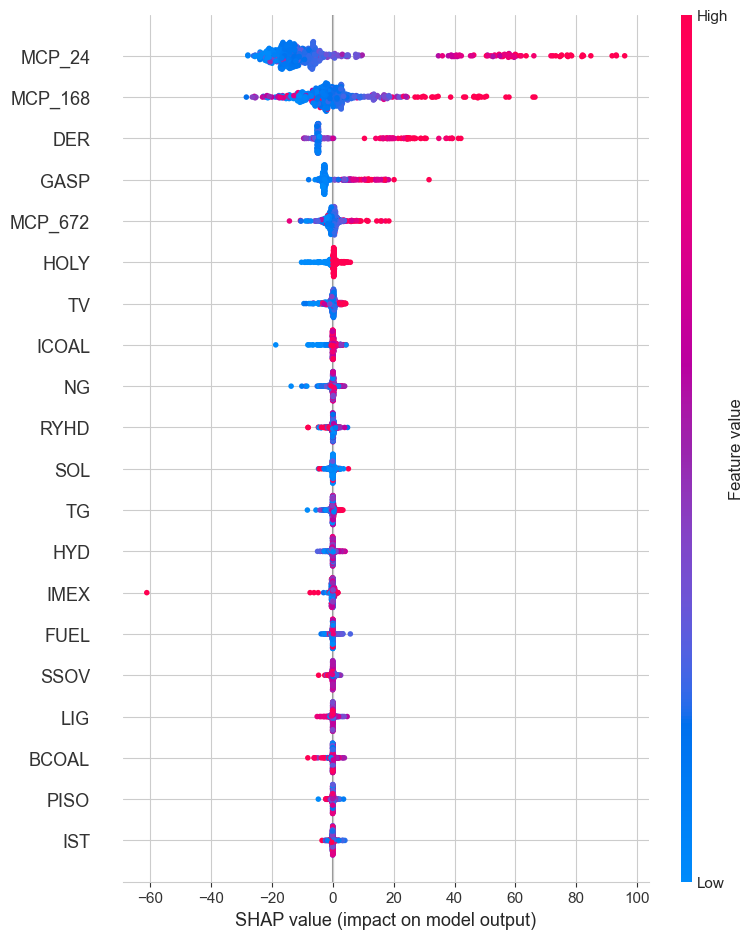

In [25]:
shap.summary_plot(rf_shap_values1, sampled_X_test1)

In [27]:
sampled_X_test2 = X_test[:4000]

In [28]:
rf_shap_values2 = rf_explainer.shap_values(sampled_X_test2, approximate=True) 

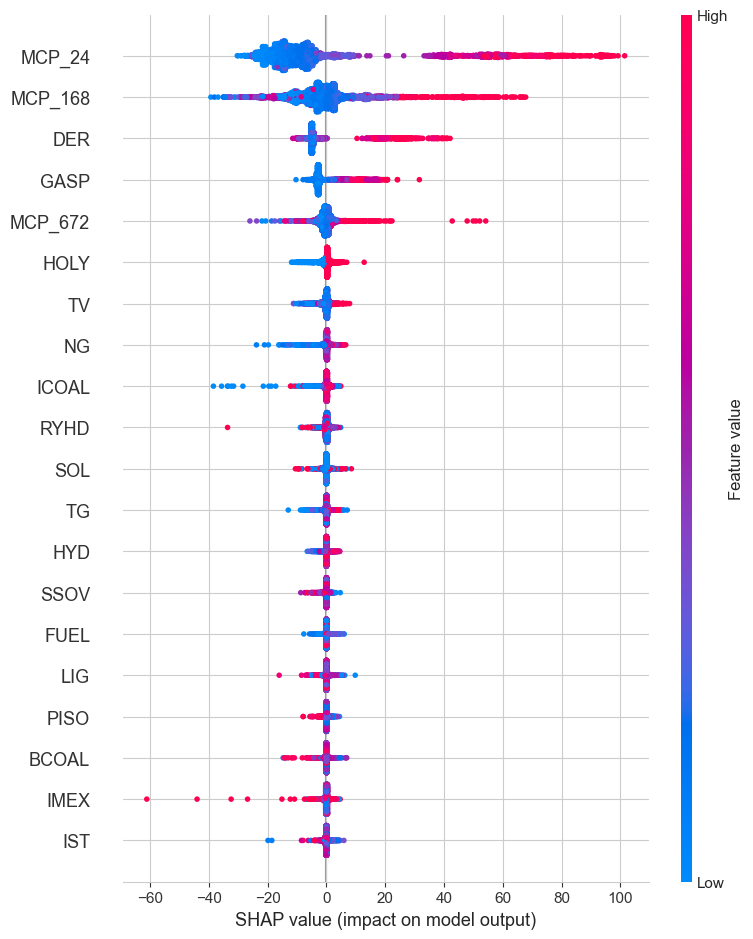

In [29]:
shap.summary_plot(rf_shap_values2, sampled_X_test2)

---

In [39]:
sampled_X_test3 = X_test[:8736]

In [40]:
rf_shap_values3 = rf_explainer.shap_values(sampled_X_test3, approximate=True) 

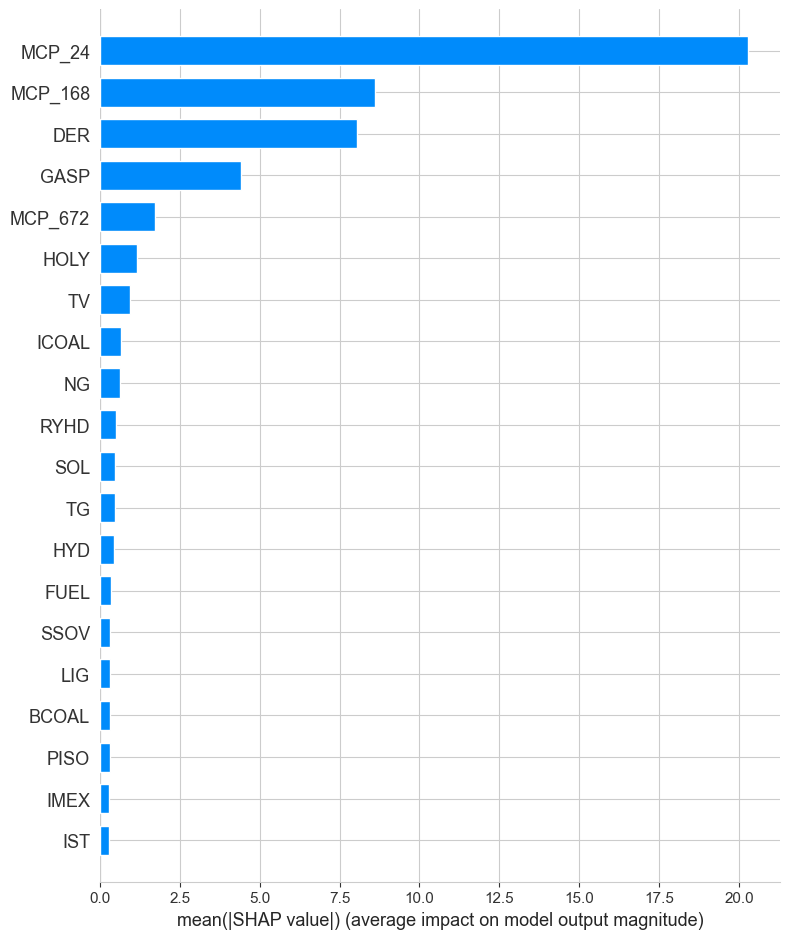

In [41]:
plt.figure(figsize=(4, 6))
shap.summary_plot(rf_shap_values3, sampled_X_test3, plot_type="bar")

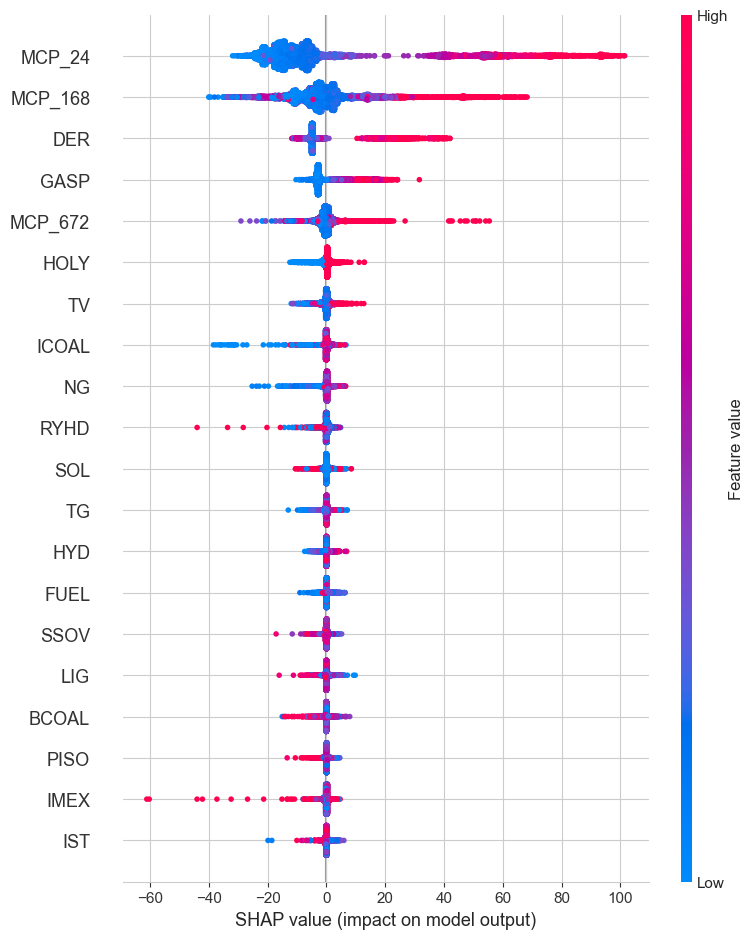

In [42]:
plt.figure(figsize=(4, 6))
shap.summary_plot(rf_shap_values3, sampled_X_test3)

## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:red; font-size:150%; text-align:center; border-radius:10px 10px;">**_3.Support Vector Regression_**</p>

### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_Tuned Svr_**</p>

In [10]:
svr_tuned =SVR(C=900, epsilon=7).fit(X_train_scaled, y_train) # 0.1, 1, 10, 100 gibi logaritmik ölçekte artan değerlerle seçilir.

In [11]:
eval_metric(svr_tuned, X_train_scaled, y_train, X_test_scaled, y_test)

,train,test
R2,0.956,0.942
mae,6.088,6.921
mse,108.723,145.590
rmse,10.427,12.066
mape,43.632,59.077


### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_Error Metrics_**</p>

In [12]:
y_pred_svr = svr_tuned.predict(X_test_scaled)

<a style="color:Blue" >**R2**</a>

In [13]:
svr_R2 = round(r2_score(y_test, y_pred_svr),3)
svr_R2

0.942

<a style="color:Blue" >**MAE**</a>

In [14]:
svr_mae = round(mean_absolute_error(y_test, y_pred_svr),2)
svr_mae

6.92

<a style="color:Blue" >**MSE**</a>

In [15]:
svr_mse = round(mean_squared_error(y_test, y_pred_svr),2)
svr_mse

145.59

<a style="color:Blue" >**RMSE**</a>

In [16]:
svr_rmse = round(mean_squared_error(y_test, y_pred_svr, squared=False),2)
svr_rmse

12.07

<a style="color:Blue" >**MAPE**</a>

In [17]:
svr_mape = round(mape(y_test, y_pred_svr),2)
svr_mape

59.08

---
---

In [ ]:
y_train_svr = svr_tuned.predict(X_train_scaled)

In [ ]:
svr_mae_train = round(mean_absolute_error(y_train, y_train_svr),2)


In [ ]:
svr_rmse_train = round(mean_squared_error(y_train, y_train_svr, squared=False),2)


In [ ]:
svr_mae / mcp_mean

In [ ]:
svr_mae_train/ mcp_mean

In [ ]:
svr_rmse / mcp_mean

In [ ]:
svr_rmse_train/ mcp_mean

---
---

<a style="color:Blue" >**_Plotting residuals_**</a>

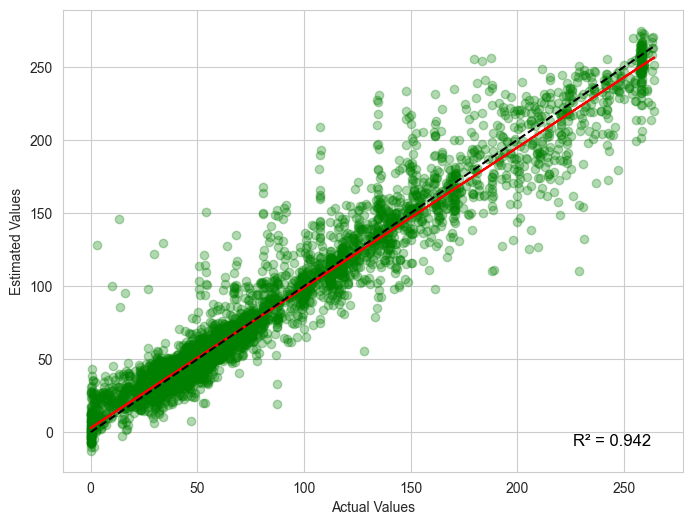

In [73]:
# Modelinizin test verisi üzerindeki tahminlerini alın
y_pred_svr = svr_tuned.predict(X_test_scaled)

plt.figure(figsize=(8, 6))

# Gerçek ve tahmin edilen değerler arasındaki scatter plot, noktaları yeşil yap
plt.scatter(y_test, y_pred_svr, alpha=0.3, color='green')

# Best fit line (en iyi uyum çizgisi) için
m, b = np.polyfit(y_test, y_pred_svr, 1)  # 1 dereceli polinom ile uyum sağla

# En iyi uyum çizgisini çiz
plt.plot(y_test, m*y_test + b, color='red')

# Kimlik çizgisi yerine, eksenleri eşitleyerek 45 derecelik bir çizgi çiz
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='--')

# R^2 değerini hesapla ve sağ alt köşeye yaz
r2 = r2_score(y_test, y_pred_svr)
plt.text(0.95, 0.05, f'R² = {r2:.3f}', verticalalignment='bottom', horizontalalignment='right', 
         transform=plt.gca().transAxes, color='black', fontsize=12)

# Eksen etiketlerini ve başlığı ayarlayın
plt.xlabel('Actual Values')
plt.ylabel('Estimated Values')
#plt.title('Prediction Error')

# Grafikleri göster
plt.show()


### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_SHAP SVR Model_**</p>

In [23]:
# Define a function that takes input data and returns model predictions
def svr_predict(data):
    return svr_tuned.predict(data)



In [24]:
# Initialize the SHAP explainer with the wrapped SVR model
explainer = shap.Explainer(svr_predict, X_train_scaled)

# Calculate SHAP values for the test data
shap_values = explainer.shap_values(X_test_scaled)

PermutationExplainer explainer: 8737it [52:34:08, 21.66s/it]                               


In [46]:
# Summarize the SHAP values
plt.figure(figsize=(4, 6))
shap.summary_plot(shap_values, X_test_scaled, plot_type='bar', show=False)

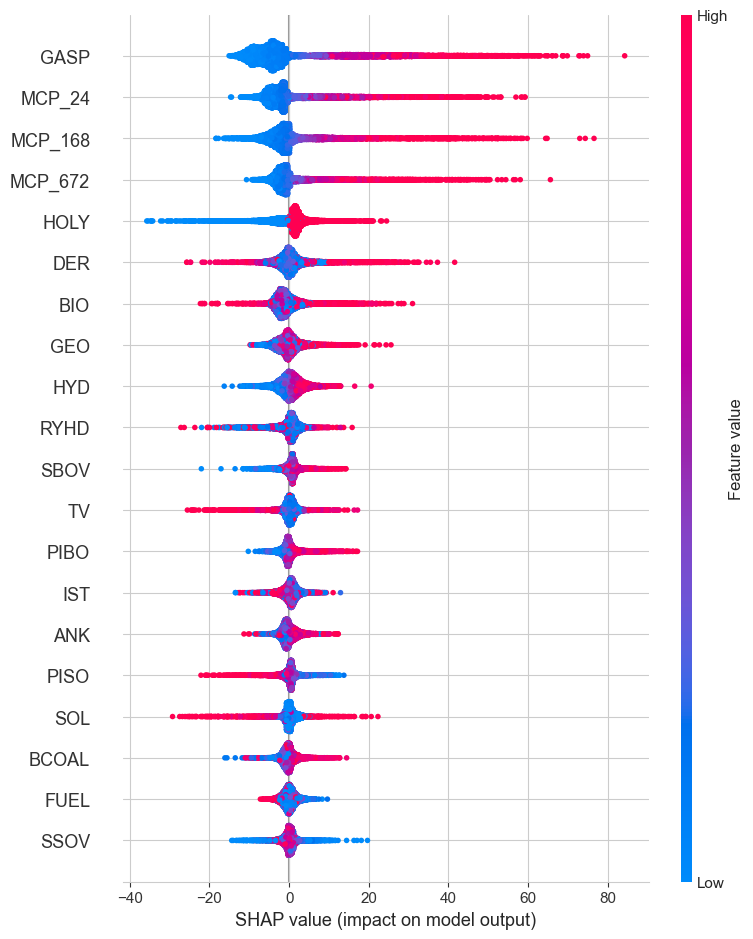

In [26]:
# Summarize the SHAP values
shap.summary_plot(shap_values, X_test_scaled, plot_type='dot', show=False)

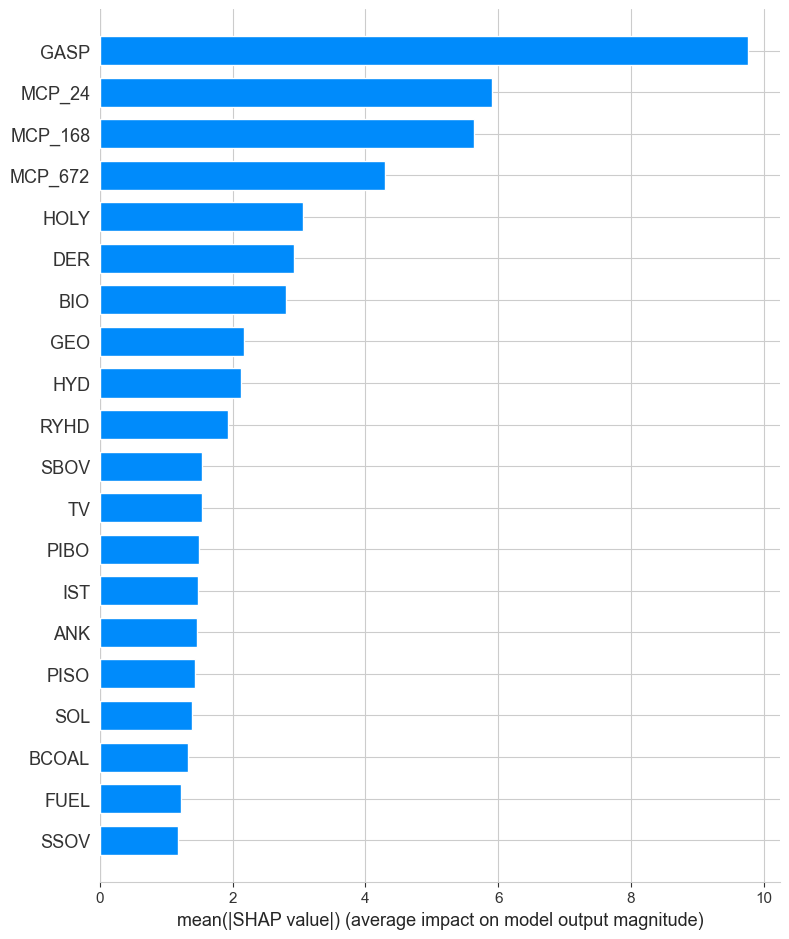

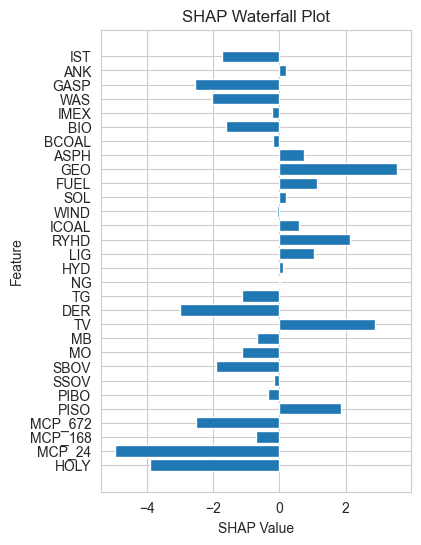

In [47]:
import shap
import matplotlib.pyplot as plt

# Assuming shap_values is the SHAP values calculated previously
# Assuming X_test_scaled is your test data

# Choose an instance for which to generate the waterfall plot (e.g., the first instance)
instance_index = 0

# Get the SHAP values for the selected instance
shap_values_instance = shap_values[instance_index]

# Get the features for the selected instance
instance_features = X_test_scaled.iloc[[instance_index]]

# Extract feature names
feature_names = instance_features.columns

# Calculate the contributions of each feature
contributions = shap_values_instance

# Initialize the SHAP waterfall plot manually
plt.figure(figsize=(4, 6))
plt.barh(y=feature_names, width=contributions)
plt.xlabel('SHAP Value')
plt.ylabel('Feature')
plt.title('SHAP Waterfall Plot')
plt.grid(True)
plt.show()


## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:red; font-size:150%; text-align:center; border-radius:10px 10px;">**_4.ANN - Sequential_**</p>

### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_Sequential Tuned_**</p>  

In [1]:
from tensorflow.keras.models import load_model
loadmodel = load_model(r'C:\Users\omerp\Desktop\gop_makale_kodlar\model3.h5')

In [39]:
y_pred_sqntl = loadmodel.predict(X_test_scaled)

273/273 [==============================] - 2s 6ms/step


In [74]:
y_pred_train = loadmodel.predict(X_train_scaled)

 281/1092 [======>.......................] - ETA: 6s

1092/1092 [==============================] - 9s 8ms/step


### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_Error Metrics_**</p>

<a style="color:Blue" >**R2**</a>

In [71]:
sequential_R2 = round(r2_score(y_test, y_pred_sqntl),3)
sequential_R2

0.944

In [75]:
train_R2 = round(r2_score(y_train, y_pred_train),3)
train_R2

0.971

<a style="color:Blue" >**MAE**</a>

In [43]:
sequential_mae = round(mean_absolute_error(y_test, y_pred_sqntl),2)
sequential_mae

6.5

In [76]:
train_mae = round(mean_absolute_error(y_train, y_pred_train),2)
train_mae

4.8

<a style="color:Blue" >**MSE**</a>

In [44]:
sequential_mse = round(mean_squared_error(y_test, y_pred_sqntl),2)
sequential_mse

141.79

In [77]:
train_mse = round(mean_squared_error(y_train, y_pred_train),2)
train_mse

71.58

<a style="color:Blue" >**RMSE**</a>

In [45]:
sequential_rmse = round(mean_squared_error(y_test, y_pred_sqntl, squared=False),2)
sequential_rmse

11.91

In [78]:
train_rmse = round(mean_squared_error(y_train, y_pred_train, squared=False),2)
train_rmse

8.46

<a style="color:Blue" >**MAPE**</a>

In [92]:
def mape1(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    absolute_percentage_error = np.abs((y_true - y_pred) / y_true)
    absolute_percentage_error[~np.isfinite(absolute_percentage_error)] = 0  # "inf" değerlerini 0'a dönüştür
    return np.mean(absolute_percentage_error) * 100

# y_pred_sqntl'yi 1 boyutlu bir diziye dönüştürme
y_pred_sqntl_1d = y_pred_sqntl.flatten()
y_pred_train_1d = y_pred_train.flatten()



In [94]:
sequential_mape = round(mape1(y_test, y_pred_sqntl_1d), 2)
sequential_mape

33.13

In [93]:
train_mape = round(mape1(y_train, y_pred_train_1d),2)
train_mape

16.15

---
---

In [95]:
mcp_mean = df["MCP"].mean()
mcp_mean

67.44918862611324

In [96]:
sequential_mae / mcp_mean

0.09636883900903587

In [97]:
train_mae / mcp_mean

0.07116468111436494

In [100]:
sequential_rmse / mcp_mean

0.17657736501501803

In [102]:
train_rmse / mcp_mean

0.12542775046406823

<a style="color:Blue" >**_Plotting residuals_**</a>

273/273 [==============================] - 1s 4ms/step


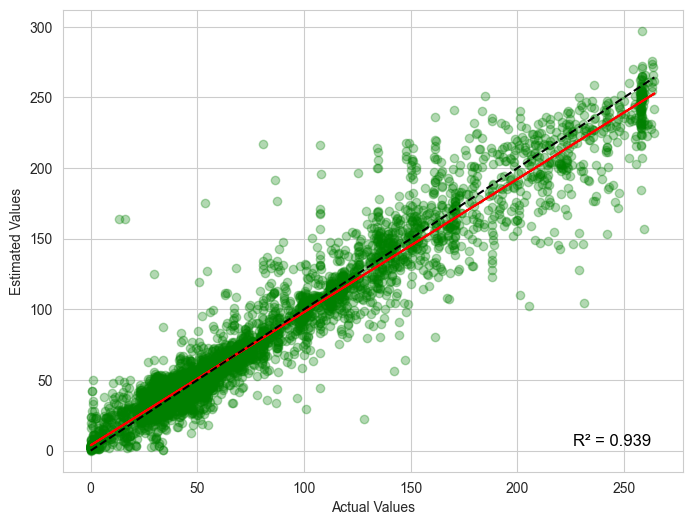

In [ ]:


# Modelinizin test verisi üzerindeki tahminlerini alın
y_pred_sqntl = loadmodel.predict(X_test_scaled)


plt.figure(figsize=(8, 6))

# Gerçek ve tahmin edilen değerler arasındaki scatter plot, noktaları yeşil yap
plt.scatter(y_test, y_pred_sqntl, alpha=0.3, color='green')

# Best fit line (en iyi uyum çizgisi) için
m, b = np.polyfit(y_test, y_pred_sqntl, 1)  # 1 dereceli polinom ile uyum sağla

# En iyi uyum çizgisini çiz
plt.plot(y_test, m*y_test + b, color='red')

# Kimlik çizgisi yerine, eksenleri eşitleyerek 45 derecelik bir çizgi çiz
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='--')

# R^2 değerini hesapla ve sağ alt köşeye yaz
r2 = r2_score(y_test, y_pred_sqntl)
plt.text(0.95, 0.05, f'R² = {r2:.3f}', verticalalignment='bottom', horizontalalignment='right', 
         transform=plt.gca().transAxes, color='black', fontsize=12)

# Eksen etiketlerini ve başlığı ayarlayın
plt.xlabel('Actual Values')
plt.ylabel('Estimated Values')
#plt.title('Prediction Error')

# Grafikleri göster
plt.show()


### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_SHAP Sequential Model_**</p>

In [121]:
ann_explainer = shap.GradientExplainer(loadmodel, X_train_scaled[:34943])

In [123]:
# X_test_scaled DataFrame'ini NumPy dizisine dönüştür
X_test_scaled_np = X_test_scaled[:8736].to_numpy()

# SHAP değerlerini hesapla
ann_shap_values = ann_explainer.shap_values(X_test_scaled_np)

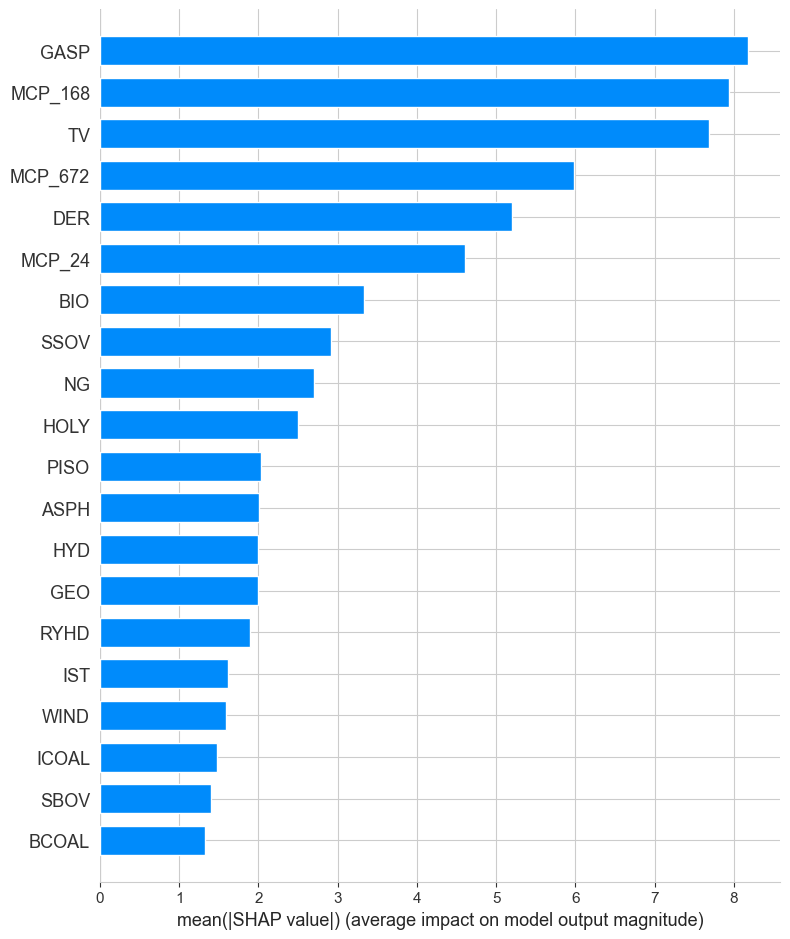

In [128]:
plt.figure(figsize=(4, 6))
shap.summary_plot(ann_shap_values[0], X_test_scaled.iloc[:8736], plot_type='bar')

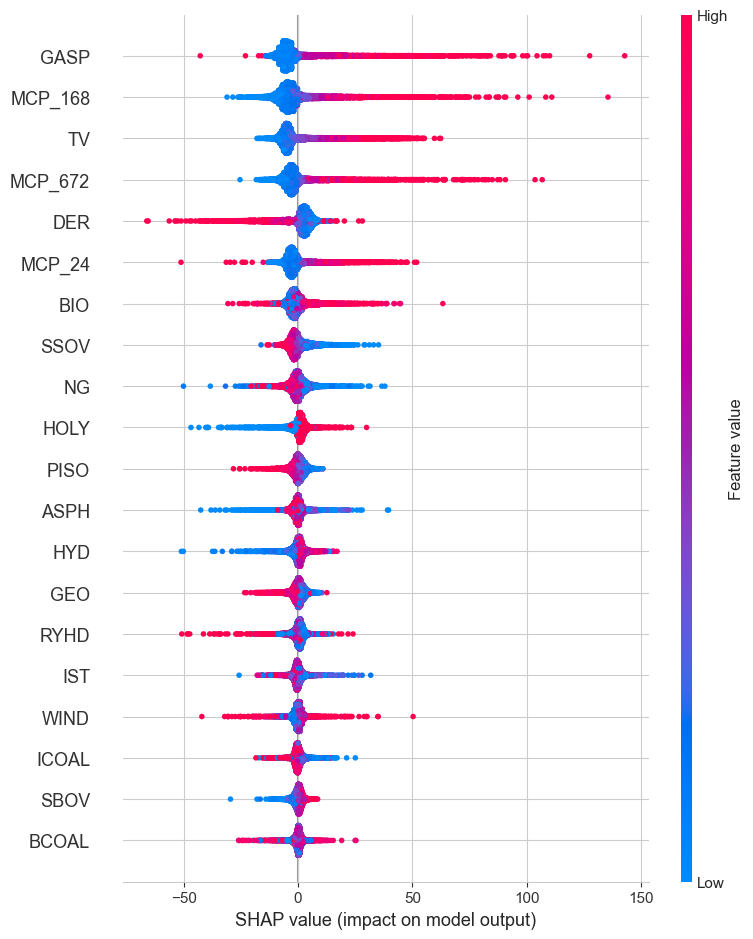

In [127]:
plt.figure(figsize=(4, 6))
shap.summary_plot(ann_shap_values[0], X_test_scaled.iloc[:8736], plot_type='dot')

## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:red; font-size:150%; text-align:center; border-radius:10px 10px;">**_5.Decision Tree Regression_**</p>

### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_DT Tuned model_**</p>

In [46]:
tuned_dt= DecisionTreeRegressor(max_depth= 10,criterion='squared_error',max_features=15,random_state=35).fit(X_train, y_train)

In [47]:
eval_metric(tuned_dt, X_train, y_train, X_test, y_test)

,train,test
R2,0.950,0.893
mae,6.367,8.369
mse,125.300,269.699
rmse,11.194,16.423
mape,54.997,97.705


## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_Error Metrics_**</p>

In [48]:
y_pred_dt = tuned_dt.predict(X_test)

<a style="color:Blue" >**R2**</a>

In [49]:
dt_R2 = round(r2_score(y_test, y_pred_dt),3)
dt_R2

0.893

<a style="color:Blue" >**MAE**</a>

In [50]:
dt_mae = round(mean_absolute_error(y_test, y_pred_dt),2)
dt_mae

8.37

<a style="color:Blue" >**MSE**</a>

In [103]:
dt_mse = round(mean_squared_error(y_test, y_pred_dt),2)
dt_mse

269.7

<a style="color:Blue" >**RMSE**</a>

In [52]:
dt_rmse = round(mean_squared_error(y_test, y_pred_dt, squared=False),2)
dt_rmse

16.42

<a style="color:Blue" >**MAPE**</a>

In [53]:
dt_mape = round(mape(y_test, y_pred_dt),2)
dt_mape

97.7

---
---

In [54]:
dt_mae/ mcp_mean

0.12409341269317387

In [104]:
dt_rmse/ mcp_mean

0.2434425133120568

---
---

<a style="color:Blue" >**_Plotting residuals_**</a>

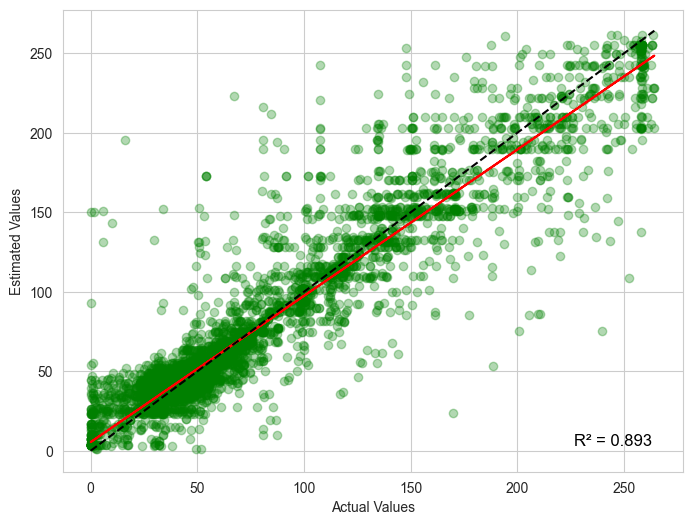

In [ ]:


# Modelinizin test verisi üzerindeki tahminlerini alın
y_pred_dt = tuned_dt.predict(X_test)

plt.figure(figsize=(8, 6))

# Gerçek ve tahmin edilen değerler arasındaki scatter plot, noktaları yeşil yap
plt.scatter(y_test, y_pred_dt, alpha=0.3, color='green')

# Best fit line (en iyi uyum çizgisi) için
m, b = np.polyfit(y_test, y_pred_dt, 1)  # 1 dereceli polinom ile uyum sağla

# En iyi uyum çizgisini çiz
plt.plot(y_test, m*y_test + b, color='red')

# Kimlik çizgisi yerine, eksenleri eşitleyerek 45 derecelik bir çizgi çiz
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='--')

# R^2 değerini hesapla ve sağ alt köşeye yaz
r2 = r2_score(y_test, y_pred_dt)
plt.text(0.95, 0.05, f'R² = {r2:.3f}', verticalalignment='bottom', horizontalalignment='right', 
         transform=plt.gca().transAxes, color='black', fontsize=12)

# Eksen etiketlerini ve başlığı ayarlayın
plt.xlabel('Actual Values')
plt.ylabel('Estimated Values')
#plt.title('Prediction Error')

# Grafikleri göster
plt.show()


### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_SHAP DT Model_**</p>

In [ ]:
dt_explainer = shap.TreeExplainer(tuned_dt)
dt_shap_values = dt_explainer(X_train)

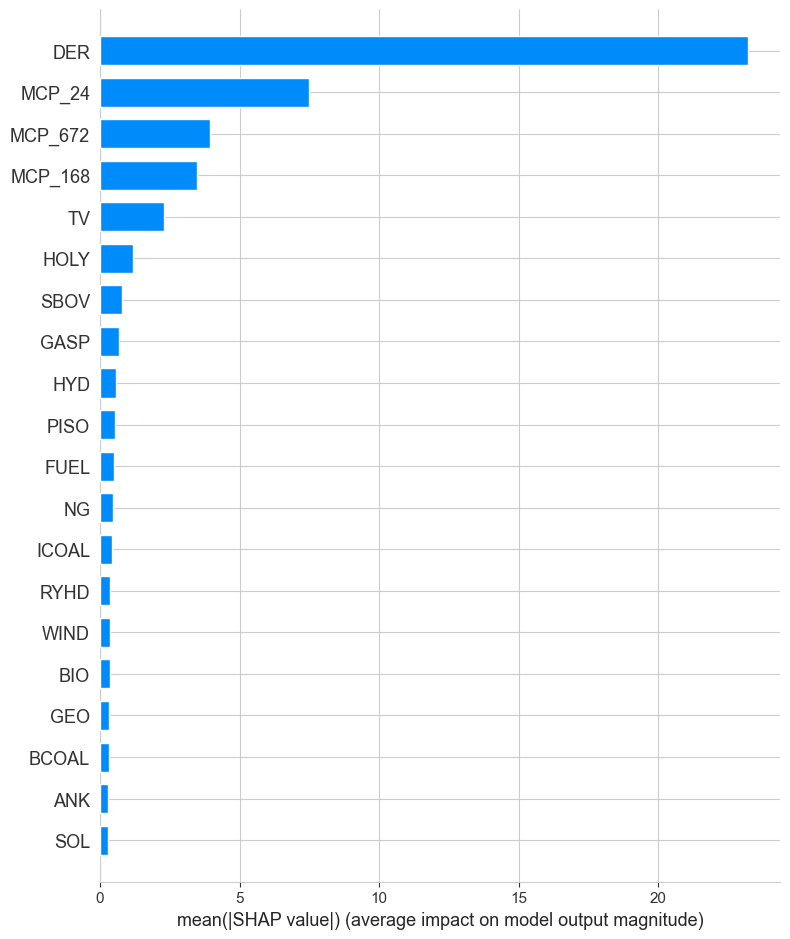

In [ ]:
plt.figure(figsize=(4, 6))
shap.summary_plot(dt_shap_values, X_train, plot_type="bar")

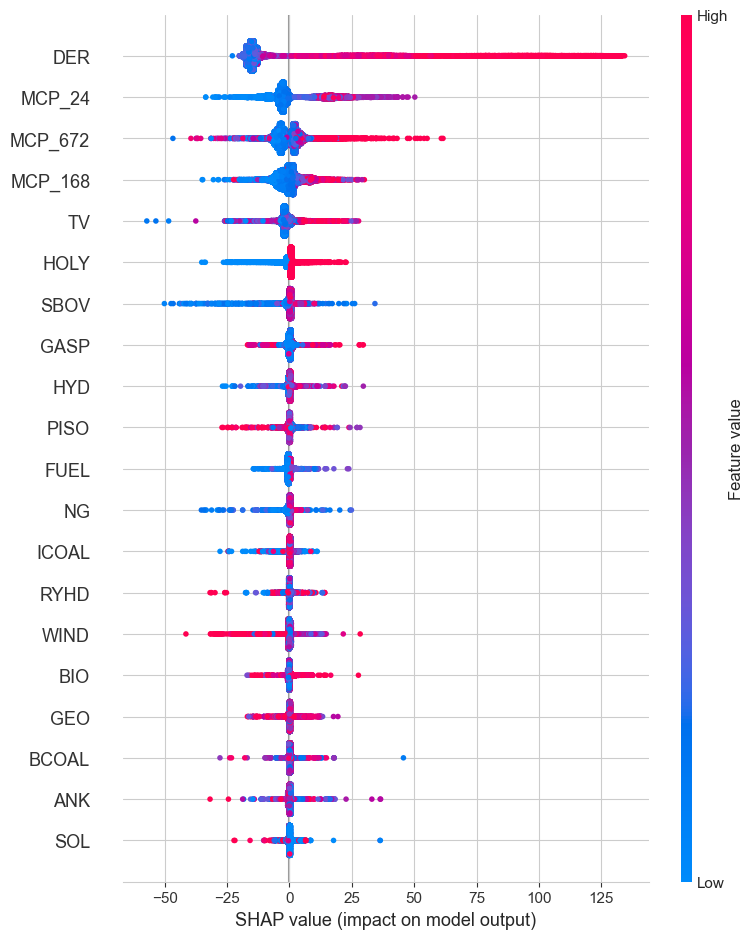

In [ ]:
#The SHAP value plot can further show the positive and negative relationships of the predictors with the target variable.
plt.figure(figsize=(4, 6))
shap.summary_plot(dt_shap_values, X_train)

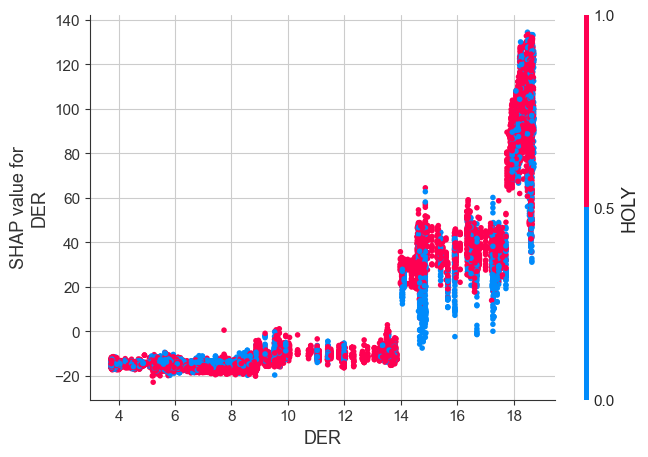

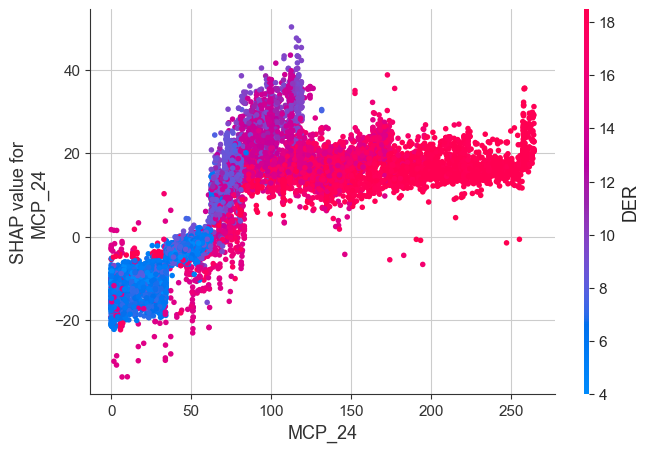

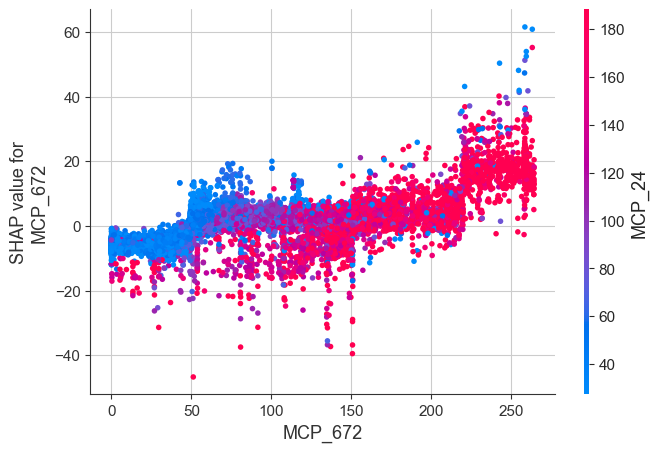

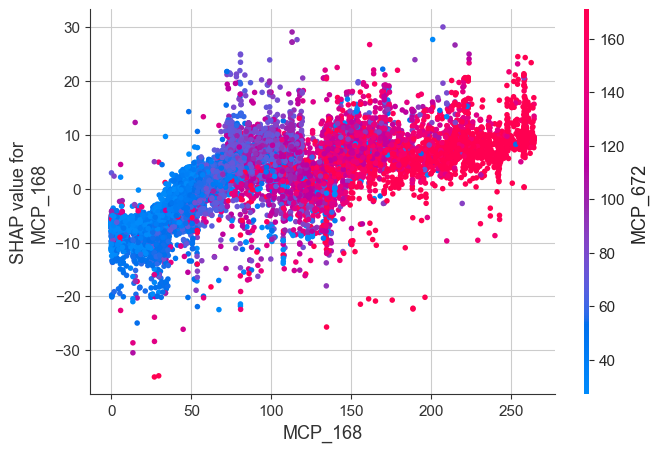

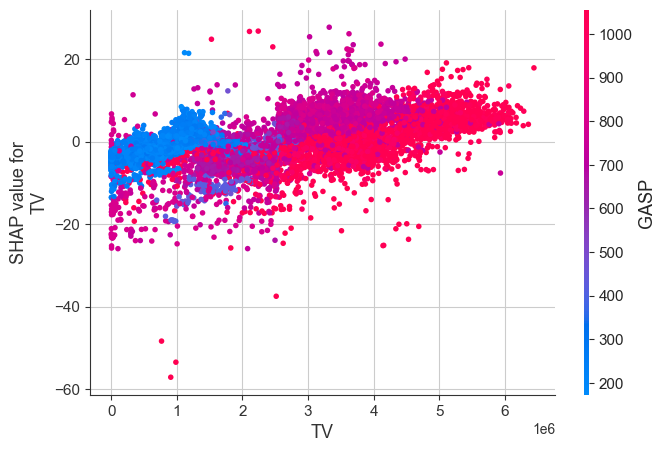

...

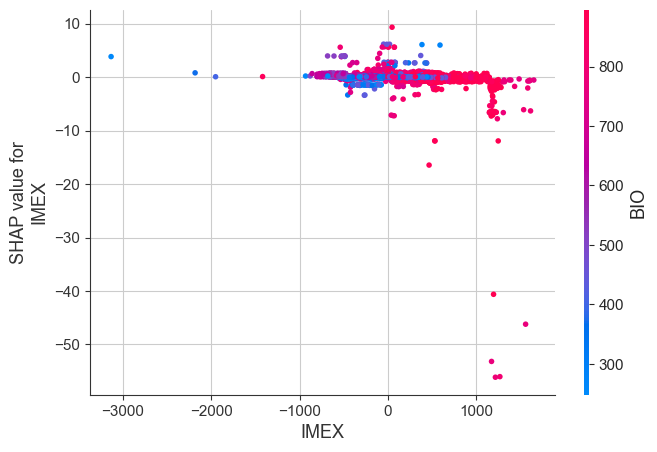

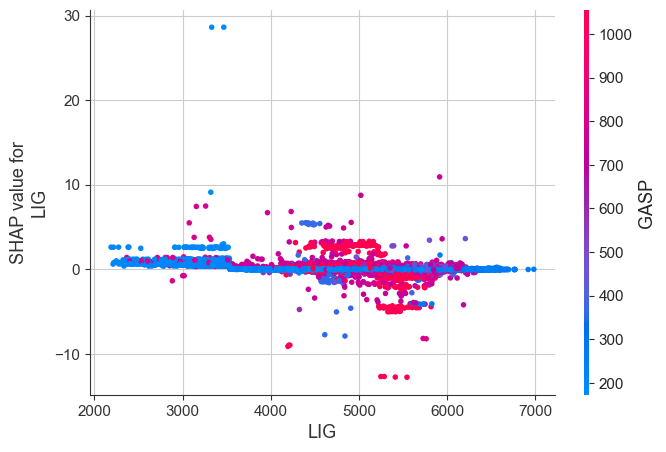

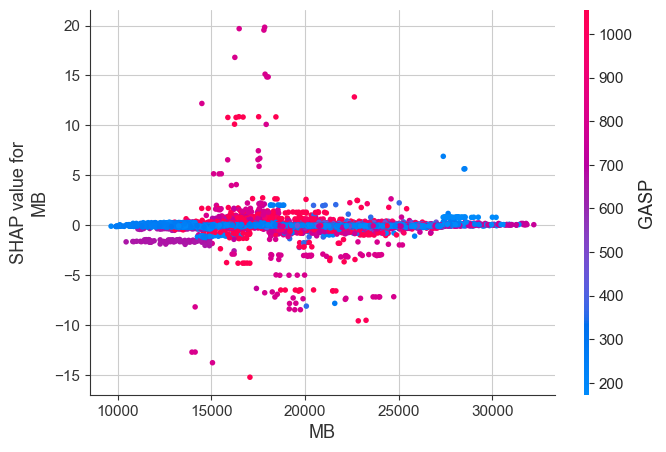

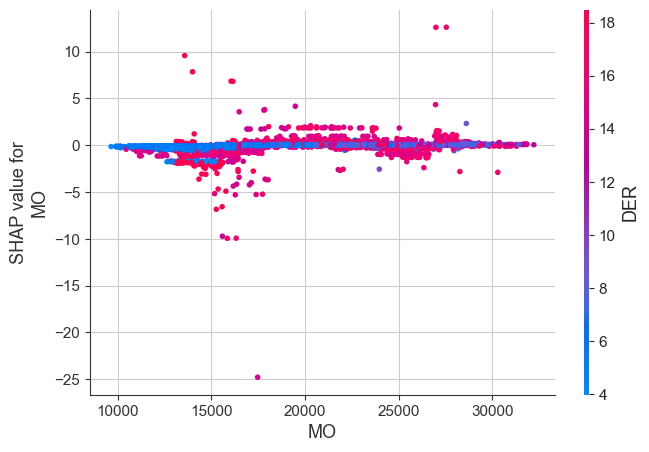

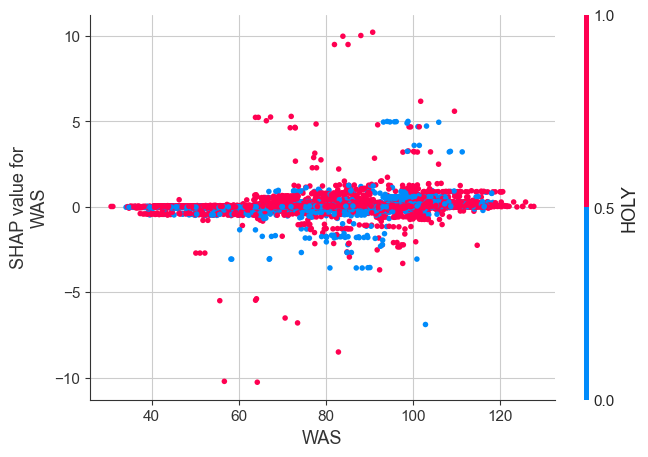

In [ ]:
# Assuming dt_shap_values is an Explanation object from SHAP
shap_values_array = dt_shap_values.values  # Extract the SHAP values as a NumPy array

# Now you can use NumPy operations on shap_values_array
top_inds_dt = np.argsort(-np.sum(np.abs(shap_values_array), 0))

# Assuming X_train is your features DataFrame or NumPy array
for i in range(0, len(top_inds_dt)):
    shap.dependence_plot(top_inds_dt[i], shap_values_array, X_train)

## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:red; font-size:150%; text-align:center; border-radius:10px 10px;">**_6.CatBoost Regression_**</p>

### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_CatBoost Tuned model_**</p>

In [55]:
tuned_ctb= CatBoostRegressor(iterations=350,
                                   depth=7,
                                   learning_rate=0.3,
                                   loss_function='RMSE',
                                   silent=True,random_state=35).fit(X_train, y_train)

In [56]:
eval_metric(tuned_ctb, X_train, y_train, X_test, y_test)

,train,test
R2,0.983,0.948
mae,4.310,6.512
mse,41.267,131.601
rmse,6.424,11.472
mape,30.209,48.796


## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_Error Metrics_**</p>

In [57]:
y_pred_ctb = tuned_ctb.predict(X_test)

<a style="color:Blue" >**R2**</a>

In [105]:
ctb_R2 = round(r2_score(y_test, y_pred_ctb),3)
ctb_R2

0.948

<a style="color:Blue" >**MAE**</a>

In [59]:
ctb_mae = round(mean_absolute_error(y_test, y_pred_ctb),2)
ctb_mae

6.51

<a style="color:Blue" >**MSE**</a>

In [60]:
ctb_mse = round(mean_squared_error(y_test, y_pred_ctb),2)
ctb_mse

131.6

<a style="color:Blue" >**RMSE**</a>

In [61]:
ctb_rmse = round(mean_squared_error(y_test, y_pred_ctb, squared=False),2)
ctb_rmse

11.47

<a style="color:Blue" >**MAPE**</a>

In [62]:
ctb_mape = round(mape(y_test, y_pred_ctb),2)
ctb_mape

48.8

---
---

In [106]:
ctb_mae/ mcp_mean

0.09651709876135746

In [107]:
ctb_rmse/ mcp_mean

0.1700539359128679

---
---

<a style="color:Blue" >**_Plotting residuals_**</a>

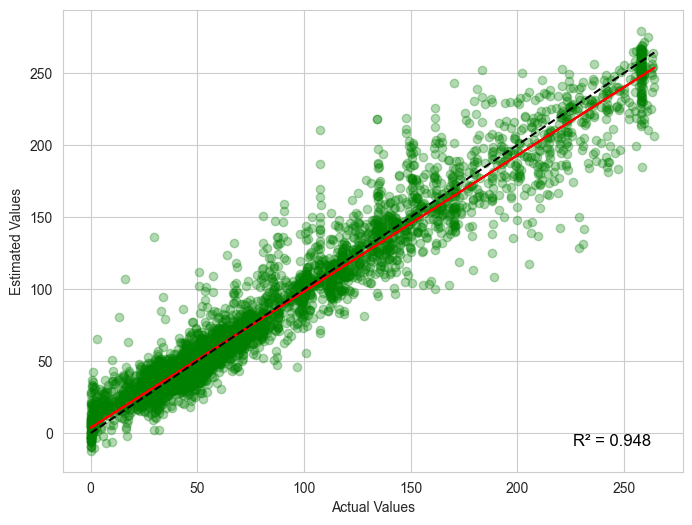

In [ ]:
# Modelinizin test verisi üzerindeki tahminlerini alın
y_pred_ctb = tuned_ctb.predict(X_test)

plt.figure(figsize=(8, 6))

# Gerçek ve tahmin edilen değerler arasındaki scatter plot, noktaları yeşil yap
plt.scatter(y_test, y_pred_ctb, alpha=0.3, color='green')

# Best fit line (en iyi uyum çizgisi) için
m, b = np.polyfit(y_test, y_pred_ctb, 1)  # 1 dereceli polinom ile uyum sağla

# En iyi uyum çizgisini çiz
plt.plot(y_test, m*y_test + b, color='red')

# Kimlik çizgisi yerine, eksenleri eşitleyerek 45 derecelik bir çizgi çiz
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='--')

# R^2 değerini hesapla ve sağ alt köşeye yaz
r2 = r2_score(y_test, y_pred_ctb)
plt.text(0.95, 0.05, f'R² = {r2:.3f}', verticalalignment='bottom', horizontalalignment='right', 
         transform=plt.gca().transAxes, color='black', fontsize=12)

# Eksen etiketlerini ve başlığı ayarlayın
plt.xlabel('Actual Values')
plt.ylabel('Estimated Values')
#plt.title('Prediction Error')

# Grafikleri göster
plt.show()


### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_SHAP Catboost Model_**</p>

In [ ]:
explainer_cat = shap.TreeExplainer(tuned_ctb)
explainer_cat

In [ ]:
shap_values_cat = explainer_cat.shap_values(X_train)

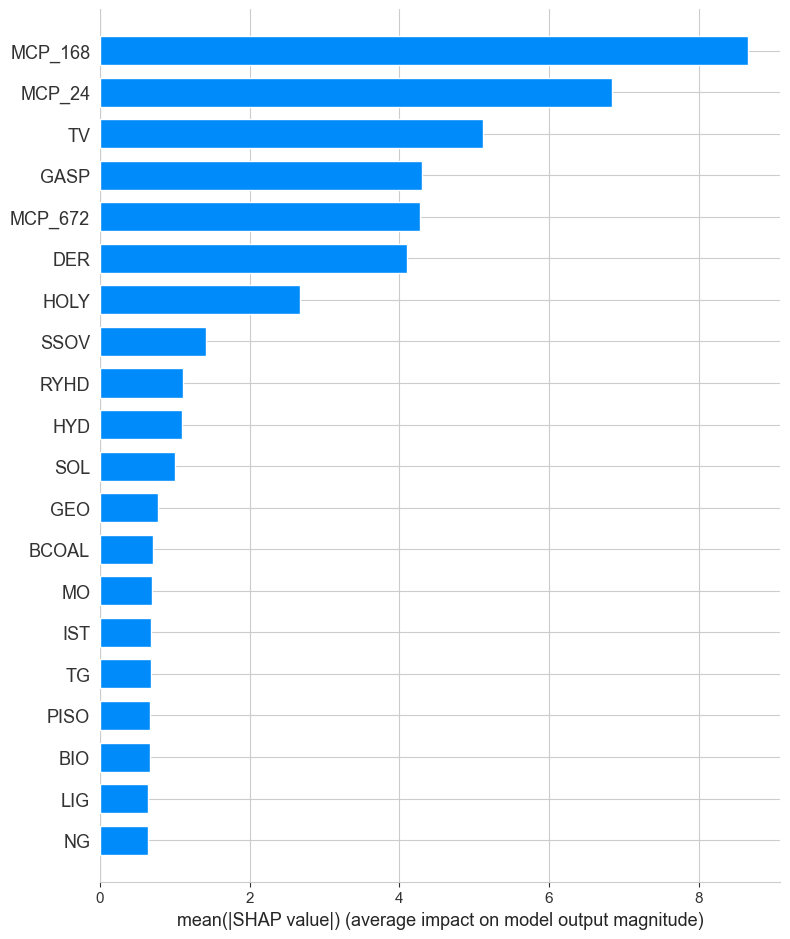

In [ ]:
plt.figure(figsize=(4, 6))
shap.summary_plot(shap_values_cat, X_train, plot_type="bar")

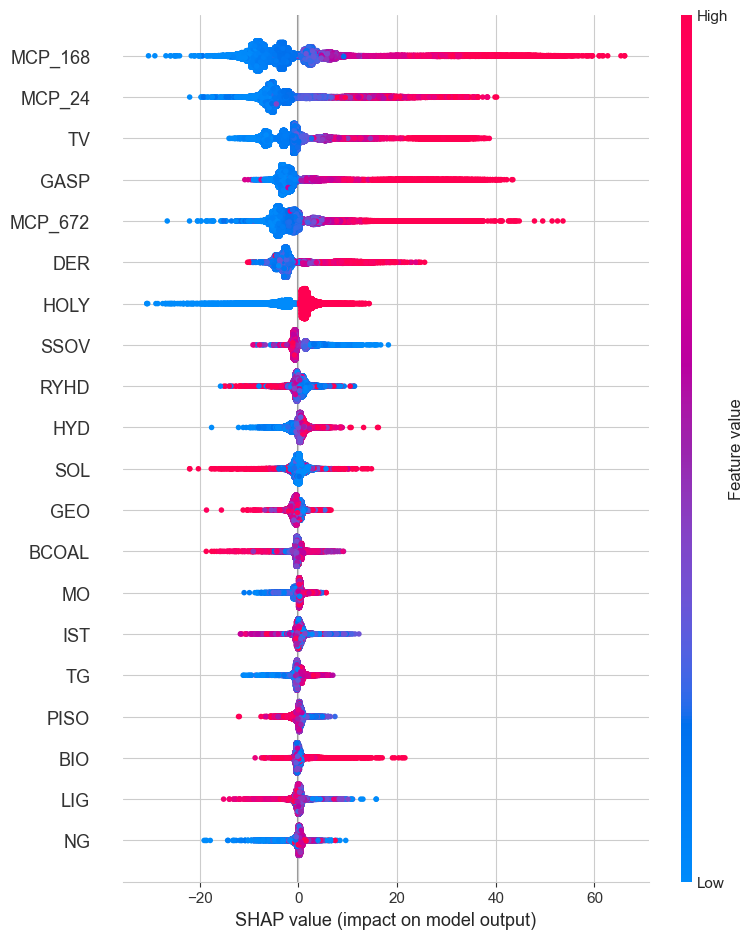

In [ ]:
plt.figure(figsize=(4, 6))
shap.summary_plot(shap_values_cat, X_train)


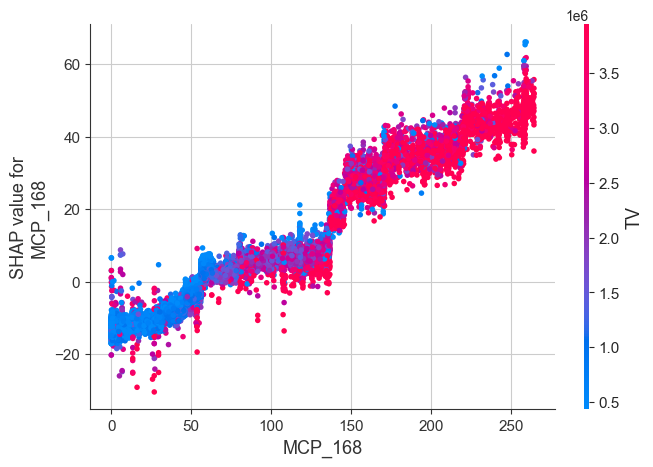

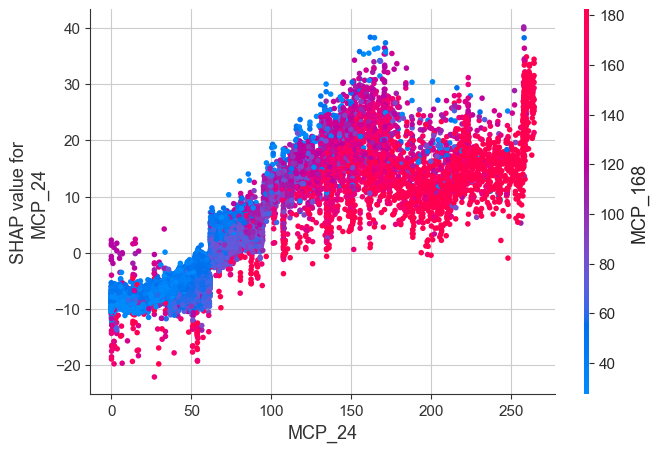

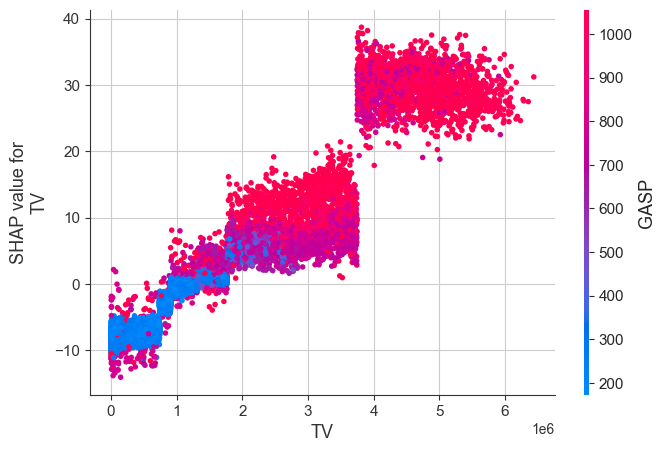

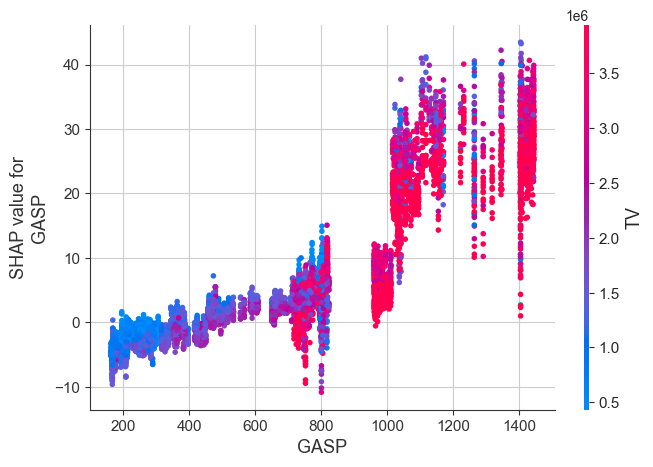

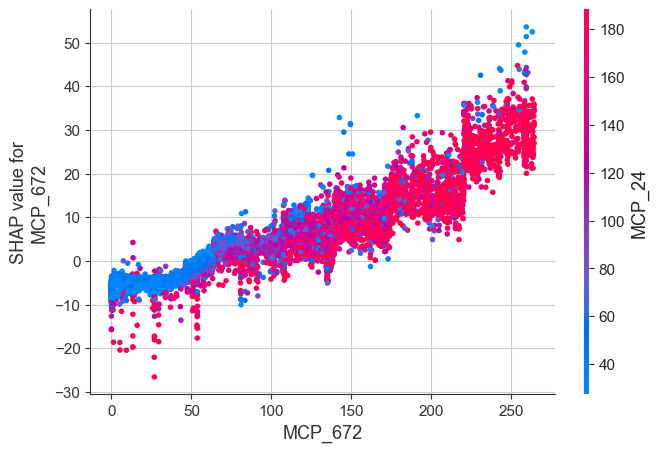

...

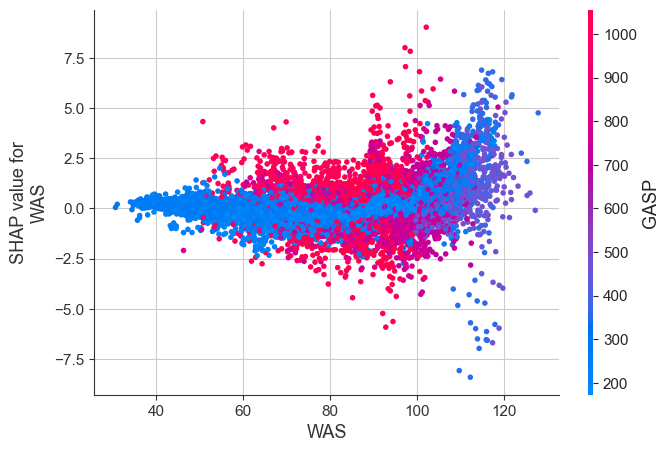

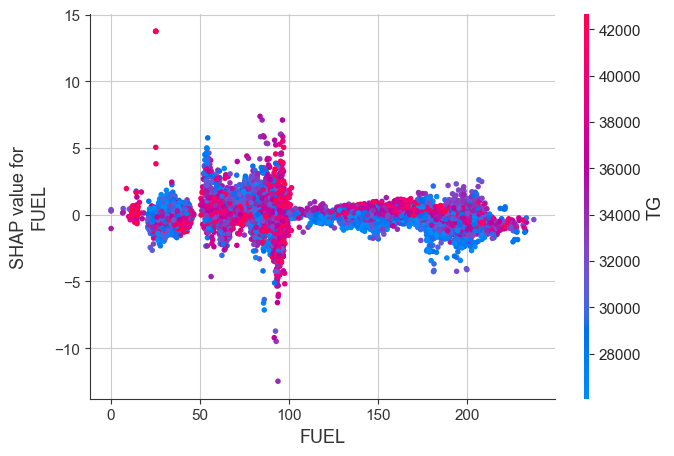

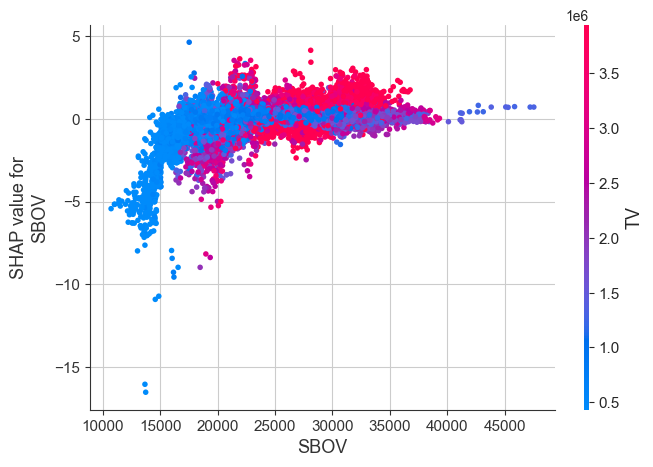

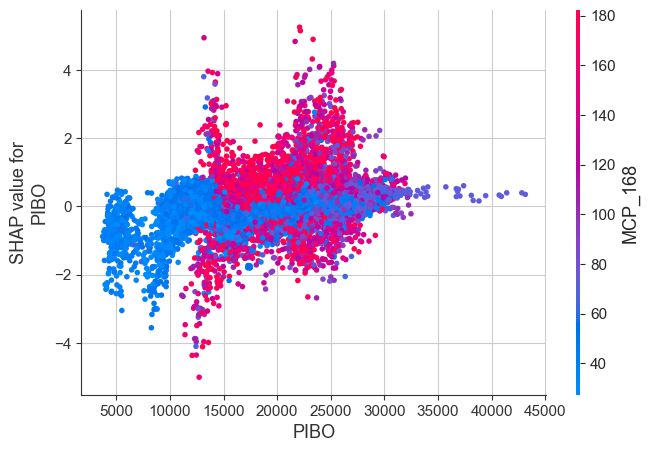

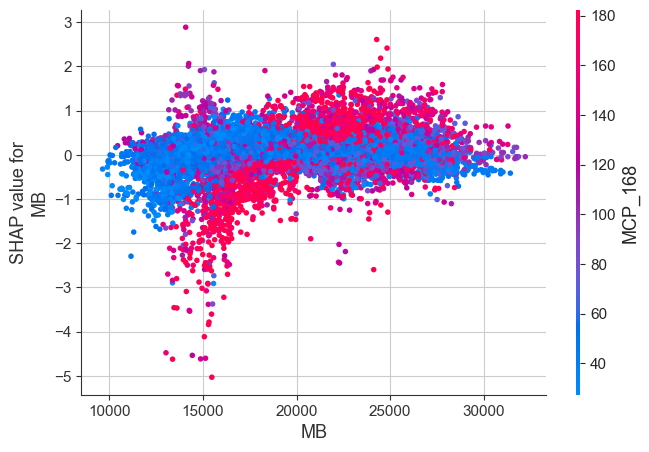

In [ ]:
top_inds = np.argsort(-np.sum(np.abs(shap_values_cat), 0))

for i in range(0,len(top_inds)):
    shap.dependence_plot(top_inds[i], shap_values_cat, X_train)

## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:red; font-size:150%; text-align:center; border-radius:10px 10px;">**_7.LightGBM Regression_**</p>

### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_LightGBM model_**</p>

In [63]:
tuned_lgb= lgb.LGBMRegressor(learning_rate= 0.2,num_leaves=60 ,n_estimators= 350,random_state=35).fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7350
[LightGBM] [Info] Number of data points in the train set: 34943, number of used features: 30
[LightGBM] [Info] Start training from score 67.445935


In [64]:
eval_metric(tuned_lgb, X_train, y_train, X_test, y_test)

,train,test
R2,0.996,0.950
mae,2.265,5.981
mse,10.944,126.528
rmse,3.308,11.248
mape,14.629,49.627


## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_Error Metrics_**</p>

In [65]:
y_pred_lgb = tuned_lgb.predict(X_test)

<a style="color:Blue" >**R2**</a>

In [66]:
lgb_R2 = round(r2_score(y_test, y_pred_lgb),3)
lgb_R2

0.95

<a style="color:Blue" >**MAE**</a>

In [67]:
lgb_mae = round(mean_absolute_error(y_test, y_pred_lgb),2)
lgb_mae

5.98

<a style="color:Blue" >**MSE**</a>

In [68]:
lgb_mse = round(mean_squared_error(y_test, y_pred_lgb),2)
lgb_mse

126.53

<a style="color:Blue" >**RMSE**</a>

In [69]:
lgb_rmse = round(mean_squared_error(y_test, y_pred_lgb, squared=False),2)
lgb_rmse

11.25

<a style="color:Blue" >**MAPE**</a>

In [70]:
lgb_mape = round(mape(y_test, y_pred_lgb),2)
lgb_mape

49.63

---
---

In [108]:
lgb_mae/ mcp_mean

0.088659331888313

In [109]:
lgb_rmse/ mcp_mean

0.16679222136179284

---
---

<a style="color:Blue" >**_Plotting residuals_**</a>

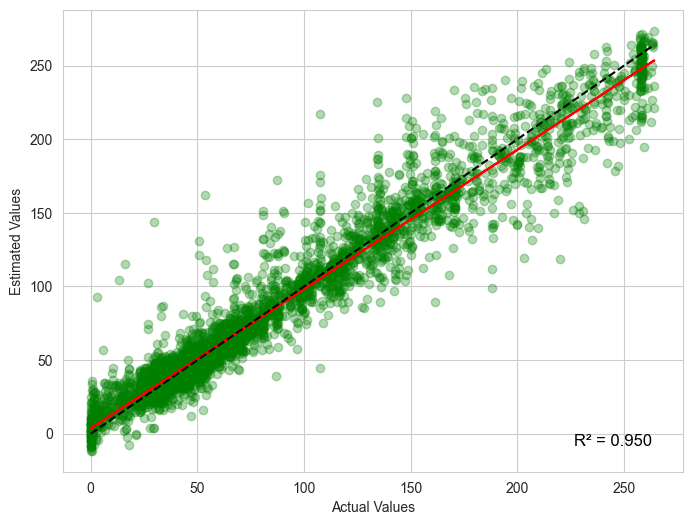

In [ ]:
# Modelinizin test verisi üzerindeki tahminlerini alın
y_pred_lgb = tuned_lgb.predict(X_test)

plt.figure(figsize=(8, 6))

# Gerçek ve tahmin edilen değerler arasındaki scatter plot, noktaları yeşil yap
plt.scatter(y_test, y_pred_lgb, alpha=0.3, color='green')

# Best fit line (en iyi uyum çizgisi) için
m, b = np.polyfit(y_test, y_pred_lgb, 1)  # 1 dereceli polinom ile uyum sağla

# En iyi uyum çizgisini çiz
plt.plot(y_test, m*y_test + b, color='red')

# Kimlik çizgisi yerine, eksenleri eşitleyerek 45 derecelik bir çizgi çiz
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='--')

# R^2 değerini hesapla ve sağ alt köşeye yaz
r2 = r2_score(y_test, y_pred_lgb)
plt.text(0.95, 0.05, f'R² = {r2:.3f}', verticalalignment='bottom', horizontalalignment='right', 
         transform=plt.gca().transAxes, color='black', fontsize=12)

# Eksen etiketlerini ve başlığı ayarlayın
plt.xlabel('Actual Values')
plt.ylabel('Estimated Values')
#plt.title('Tahmin Hatası')

# Grafikleri göster
plt.show()


### <p style="background-color:#FDFEFE; font-family:newtimeroman; color:green; font-size:150%;  border-radius:10px 10px;">**_SHAP LightGBM Model_**</p>

In [ ]:
explainer_lightgbm = shap.TreeExplainer(tuned_lgb)
explainer_lightgbm

In [ ]:
shap_values_lightgbm = explainer_lightgbm.shap_values(X_train)

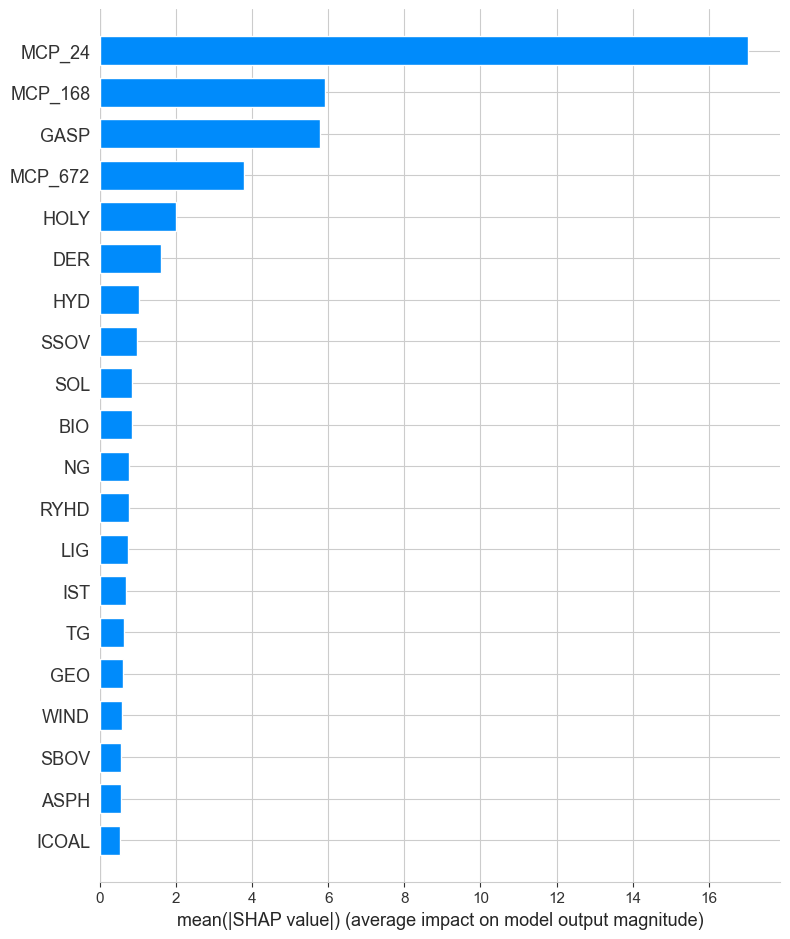

In [ ]:
plt.figure(figsize=(4, 6))
shap.summary_plot(shap_values_lightgbm, X_train, plot_type="bar")

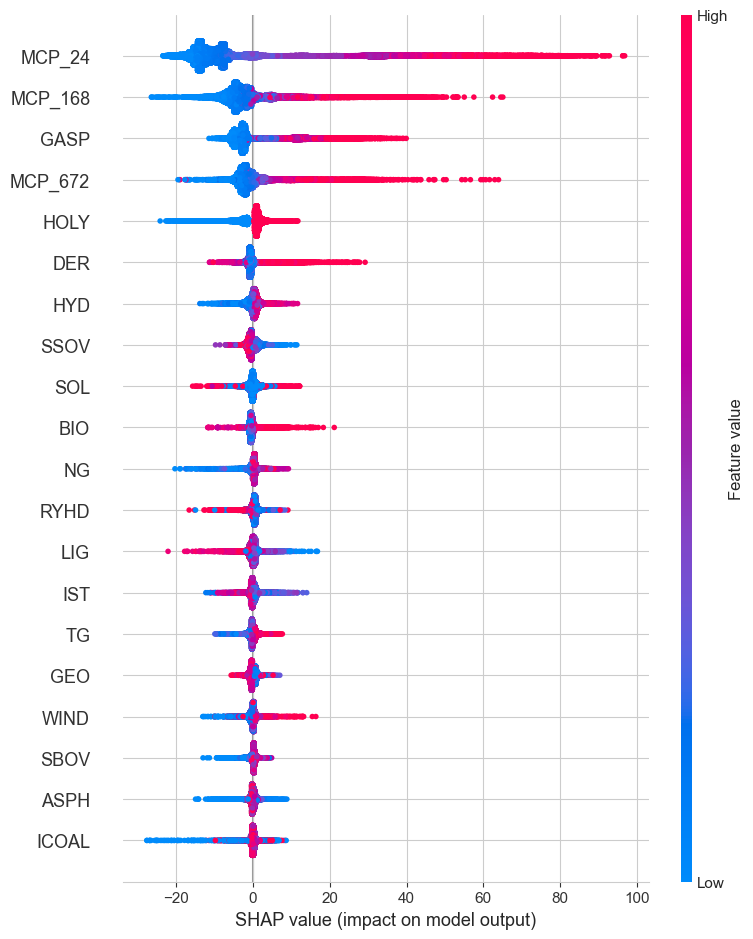

In [ ]:
plt.figure(figsize=(4, 6))
shap.summary_plot(shap_values_lightgbm, X_train)

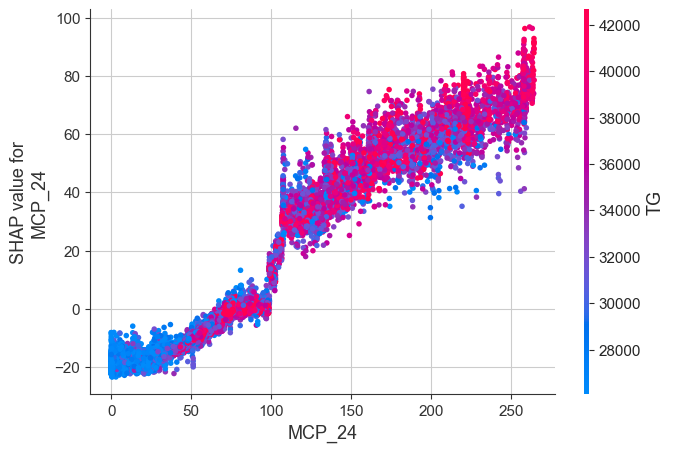

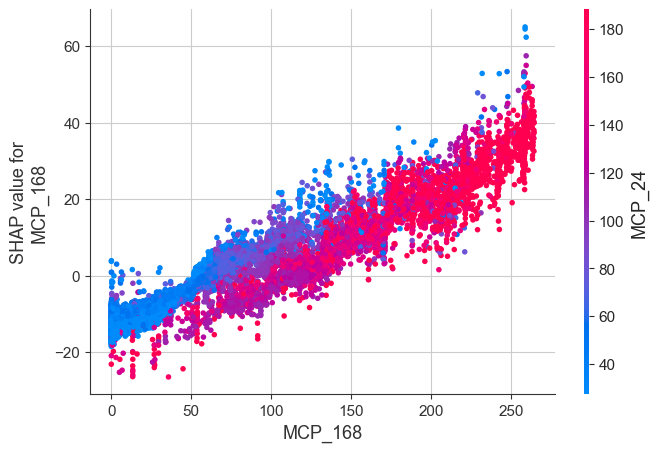

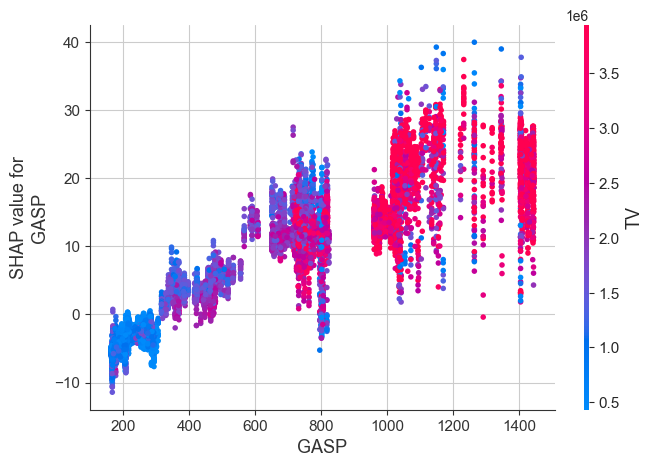

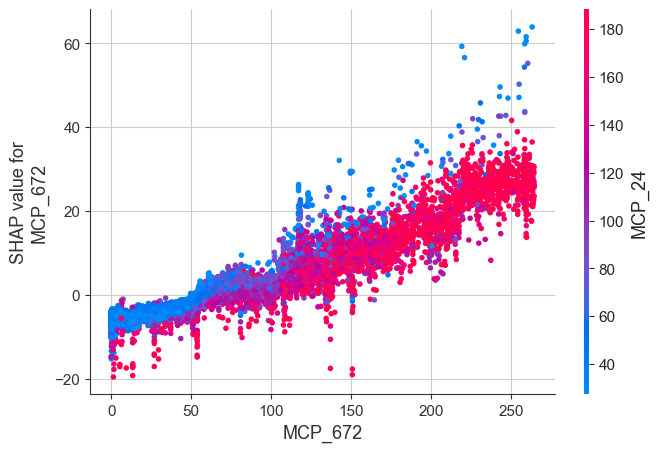

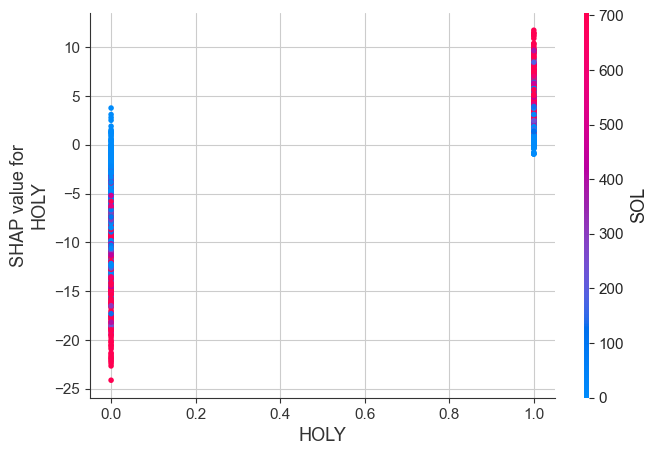

...

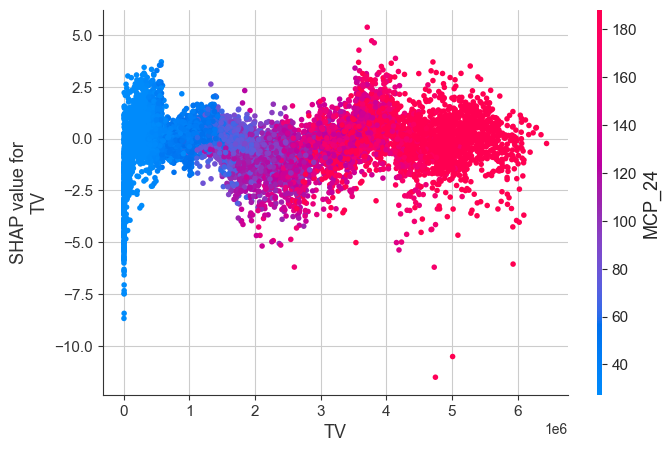

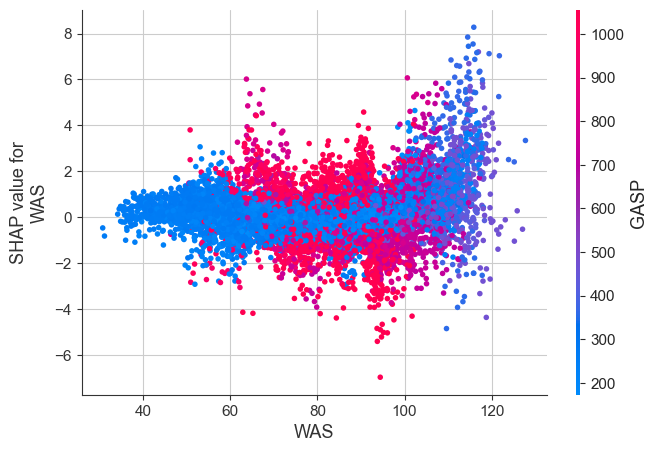

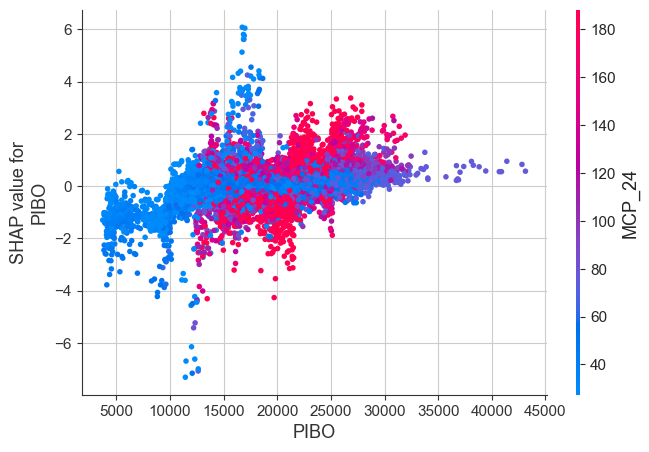

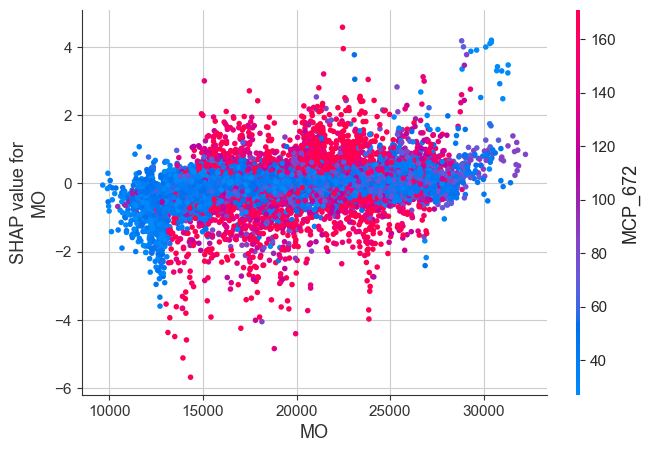

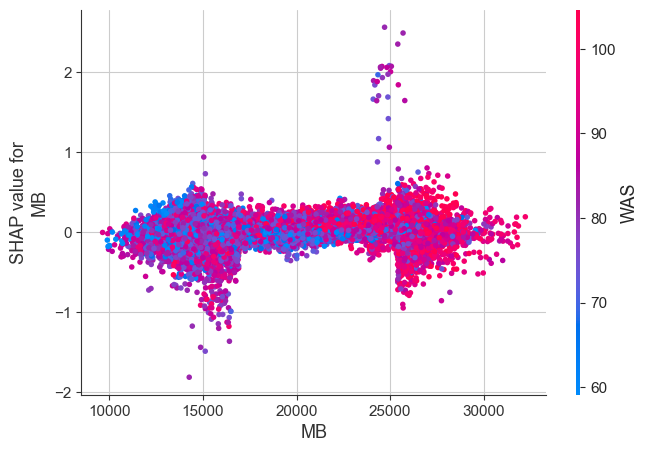

In [ ]:
top_inds = np.argsort(-np.sum(np.abs(shap_values_lightgbm), 0))

for i in range(0,len(top_inds)):
    shap.dependence_plot(top_inds[i], shap_values_lightgbm, X_train)

## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:blue; font-size:150%; text-align:center; border-radius:10px 10px;">**_Compare Scores_**</p>

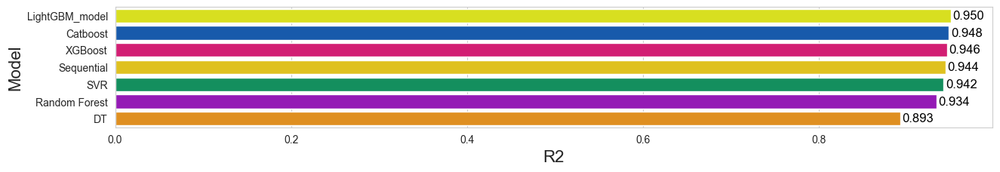

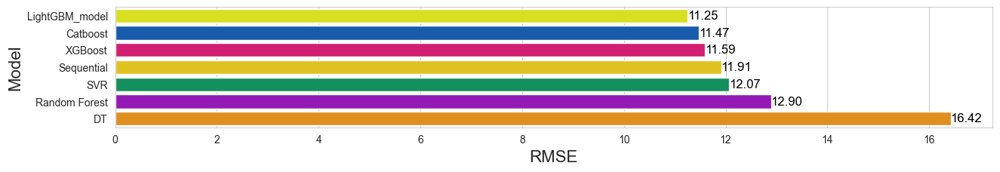

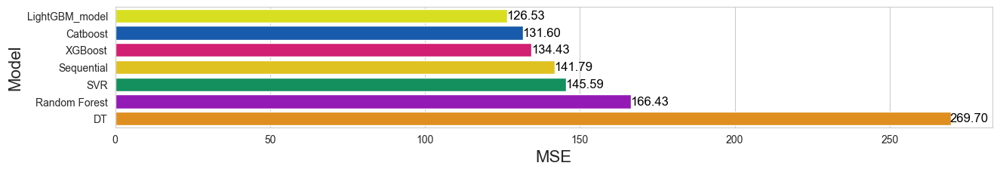

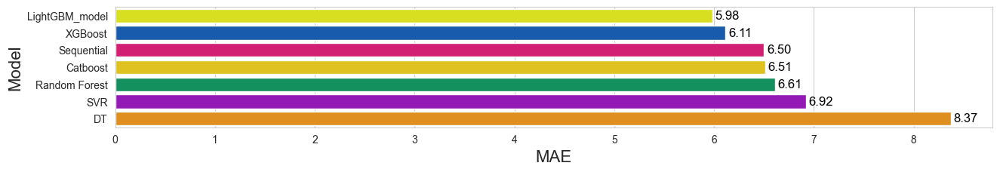

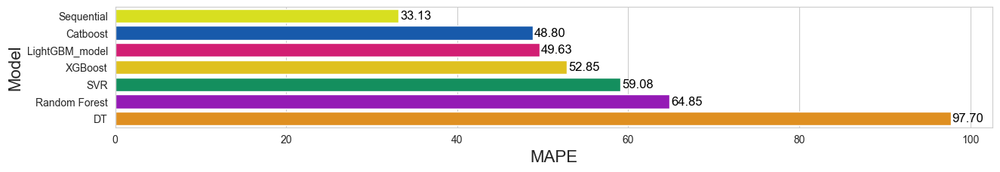

In [117]:

compare = pd.DataFrame({
    "Model": ["DT", "Catboost", "SVR", "Random Forest", "XGBoost", "Sequential", "LightGBM_model"],
    "R2": [dt_R2, ctb_R2, svr_R2, rf_R2, xgb_R2, sequential_R2, lgb_R2],
    "MSE": [dt_mse, ctb_mse, svr_mse, rf_mse, xgb_mse, sequential_mse, lgb_mse],
    "MAE": [dt_mae, ctb_mae, svr_mae, rf_mae, xgb_mae, sequential_mae, lgb_mae],
    "RMSE": [dt_rmse, ctb_rmse, svr_rmse, rf_rmse, xgb_rmse, sequential_rmse, lgb_rmse],
    "MAPE": [dt_mape, ctb_mape, svr_mape, rf_mape, xgb_mape, sequential_mape, lgb_mape]
})

# R2
plt.figure(figsize=(15, 12))
plt.subplot(511)
compare = compare.sort_values(by="R2", ascending=False)
ax = sns.barplot(x="R2", y="Model", data=compare, palette="prism")
ax.set_xlabel("R2", fontsize=16)
ax.set_ylabel("Model", fontsize=16)
for p in ax.patches:
    ax.annotate(f"{p.get_width():.3f}", (p.get_width() + 0.02, p.get_y() + p.get_height() / 2),
                ha='center', va='center', fontsize=12, color='black')
plt.show()

# RMSE
plt.figure(figsize=(15, 12))
plt.subplot(514)
compare = compare.sort_values(by="RMSE", ascending=True)
ax = sns.barplot(x="RMSE", y="Model", data=compare, palette="prism")
ax.set_xlabel("RMSE", fontsize=16)
ax.set_ylabel("Model", fontsize=16)
for p in ax.patches:
    ax.annotate(f"{p.get_width():.2f}", (p.get_width() + 0.3, p.get_y() + p.get_height() / 2),
                ha='center', va='center', fontsize=12, color='black')
plt.show()

# MSE
plt.figure(figsize=(15, 12))
plt.subplot(512)
compare = compare.sort_values(by="MSE", ascending=True)
ax = sns.barplot(x="MSE", y="Model", data=compare, palette="prism")
ax.set_xlabel("MSE", fontsize=16)
ax.set_ylabel("Model", fontsize=16)
for p in ax.patches:
    ax.annotate(f"{p.get_width():.2f}", (p.get_width() + 6.0, p.get_y() + p.get_height() / 2),
                ha='center', va='center', fontsize=12, color='black')
plt.show()

# MAE
plt.figure(figsize=(15, 12))
plt.subplot(513)
compare = compare.sort_values(by="MAE", ascending=True)
ax = sns.barplot(x="MAE", y="Model", data=compare, palette="prism")
ax.set_xlabel("MAE", fontsize=16)
ax.set_ylabel("Model", fontsize=16)
for p in ax.patches:
    ax.annotate(f"{p.get_width():.2f}", (p.get_width() + 0.15, p.get_y() + p.get_height() / 2),
                ha='center', va='center', fontsize=12, color='black')
plt.show()

# MAPE
plt.figure(figsize=(15, 12))
plt.subplot(515)
compare = compare.sort_values(by="MAPE", ascending=True)
ax = sns.barplot(x="MAPE", y="Model", data=compare, palette="prism")
ax.set_xlabel("MAPE", fontsize=16)
ax.set_ylabel("Model", fontsize=16)
for p in ax.patches:
    ax.annotate(f"{p.get_width():.2f}", (p.get_width() + 2.0, p.get_y() + p.get_height() / 2),
                ha='center', va='center', fontsize=12, color='black')
plt.show()

